In [98]:
#Exploratory Data Analysis
#importing the libraries for matrix and dataframe handling, plotting, etc 
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

#miscellaneous libraries used
import re
import itertools
from collections import Counter
from sys import maxsize
import math
import warnings
warnings.filterwarnings("ignore")

#importing the NLP and Data Visualisation related libraries
import string
from string import ascii_letters, punctuation, digits
import nltk
nltk.download('all')
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud, STOPWORDS
from textblob import TextBlob
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to /root/nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger is already up-
[nltk_data]    |       to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger_ru is already
[nltk_data]    |       up-to-date!
[nltk_data]    | Downloading package basque_grammars to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package basque_grammars is already up-to-date!
[nltk_data]    | Downloading package biocreative_ppi to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Pac

In [99]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [100]:
products = pd.read_csv("/content/drive/MyDrive/flipkart_com-ecommerce_sample.csv")
products.head(5)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,c2d766ca982eca8304150849735ffef9,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",SRTEH2FF9KEDEFGF,999.0,379.0,"[""http://img5a.flixcart.com/image/short/u/4/a/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
1,7f7036a6d550aaa89d34c77bd39a5e48,2016-03-25 22:59:23 +0000,http://www.flipkart.com/fabhomedecor-fabric-do...,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",SBEEH3QGU7MFYJFY,32157.0,22646.0,"[""http://img6a.flixcart.com/image/sofa-bed/j/f...",False,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,No rating available,No rating available,FabHomeDecor,"{""product_specification""=>[{""key""=>""Installati..."
2,f449ec65dcbc041b6ae5e6a32717d01b,2016-03-25 22:59:23 +0000,http://www.flipkart.com/aw-bellies/p/itmeh4grg...,AW Bellies,"[""Footwear >> Women's Footwear >> Ballerinas >...",SHOEH4GRSUBJGZXE,999.0,499.0,"[""http://img5a.flixcart.com/image/shoe/7/z/z/r...",False,Key Features of AW Bellies Sandals Wedges Heel...,No rating available,No rating available,AW,"{""product_specification""=>[{""key""=>""Ideal For""..."
3,0973b37acd0c664e3de26e97e5571454,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",SRTEH2F6HUZMQ6SJ,699.0,267.0,"[""http://img5a.flixcart.com/image/short/6/2/h/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
4,bc940ea42ee6bef5ac7cea3fb5cfbee7,2016-03-25 22:59:23 +0000,http://www.flipkart.com/sicons-all-purpose-arn...,Sicons All Purpose Arnica Dog Shampoo,"[""Pet Supplies >> Grooming >> Skin & Coat Care...",PSOEH3ZYDMSYARJ5,220.0,210.0,"[""http://img5a.flixcart.com/image/pet-shampoo/...",False,Specifications of Sicons All Purpose Arnica Do...,No rating available,No rating available,Sicons,"{""product_specification""=>[{""key""=>""Pet Type"",..."


In [101]:
product = pd.read_csv("/content/drive/MyDrive/amz_com-ecommerce_sample.csv")
product.head(5)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,c2d766ca982eca8304150849735ffef9,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",SRTEH2FF9KEDEFGF,982,438,"[""http://img5a.flixcart.com/image/short/u/4/a/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
1,7f7036a6d550aaa89d34c77bd39a5e48,2016-03-25 22:59:23 +0000,http://www.flipkart.com/fabhomedecor-fabric-do...,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",SBEEH3QGU7MFYJFY,32143,29121,"[""http://img6a.flixcart.com/image/sofa-bed/j/f...",False,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,No rating available,No rating available,FabHomeDecor,"{""product_specification""=>[{""key""=>""Installati..."
2,f449ec65dcbc041b6ae5e6a32717d01b,2016-03-25 22:59:23 +0000,http://www.flipkart.com/aw-bellies/p/itmeh4grg...,AW Bellies,"[""Footwear >> Women's Footwear >> Ballerinas >...",SHOEH4GRSUBJGZXE,991,551,"[""http://img5a.flixcart.com/image/shoe/7/z/z/r...",False,Key Features of AW Bellies Sandals Wedges Heel...,No rating available,No rating available,AW,"{""product_specification""=>[{""key""=>""Ideal For""..."
3,0973b37acd0c664e3de26e97e5571454,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",SRTEH2F6HUZMQ6SJ,694,325,"[""http://img5a.flixcart.com/image/short/6/2/h/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
4,bc940ea42ee6bef5ac7cea3fb5cfbee7,2016-03-25 22:59:23 +0000,http://www.flipkart.com/sicons-all-purpose-arn...,Sicons All Purpose Arnica Dog Shampoo,"[""Pet Supplies >> Grooming >> Skin & Coat Care...",PSOEH3ZYDMSYARJ5,208,258,"[""http://img5a.flixcart.com/image/pet-shampoo/...",False,Specifications of Sicons All Purpose Arnica Do...,No rating available,No rating available,Sicons,"{""product_specification""=>[{""key""=>""Pet Type"",..."


In [102]:
products.shape

(20000, 15)

In [103]:
product.shape

(20000, 15)

In [104]:
#summary of the dataframe is shown below:
products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  20000 non-null  object 
 1   crawl_timestamp          20000 non-null  object 
 2   product_url              20000 non-null  object 
 3   product_name             20000 non-null  object 
 4   product_category_tree    20000 non-null  object 
 5   pid                      20000 non-null  object 
 6   retail_price             19922 non-null  float64
 7   discounted_price         19922 non-null  float64
 8   image                    19997 non-null  object 
 9   is_FK_Advantage_product  20000 non-null  bool   
 10  description              19998 non-null  object 
 11  product_rating           20000 non-null  object 
 12  overall_rating           20000 non-null  object 
 13  brand                    14136 non-null  object 
 14  product_specifications

In [105]:
#summary of the dataframe is shown below:
product.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   uniq_id                  20000 non-null  object
 1   crawl_timestamp          20000 non-null  object
 2   product_url              20000 non-null  object
 3   product_name             20000 non-null  object
 4   product_category_tree    20000 non-null  object
 5   pid                      20000 non-null  object
 6   retail_price             20000 non-null  int64 
 7   discounted_price         20000 non-null  int64 
 8   image                    19997 non-null  object
 9   is_FK_Advantage_product  20000 non-null  bool  
 10  description              19998 non-null  object
 11  product_rating           20000 non-null  object
 12  overall_rating           20000 non-null  object
 13  brand                    14136 non-null  object
 14  product_specifications   19986 non-nul

In [106]:
#Dropping the NaN's and duplicate Product Descriptions
print(products.isna().sum())

uniq_id                       0
crawl_timestamp               0
product_url                   0
product_name                  0
product_category_tree         0
pid                           0
retail_price                 78
discounted_price             78
image                         3
is_FK_Advantage_product       0
description                   2
product_rating                0
overall_rating                0
brand                      5864
product_specifications       14
dtype: int64


In [107]:
#Dropping the NaN's and duplicate Product Descriptions
print(product.isna().sum())

uniq_id                       0
crawl_timestamp               0
product_url                   0
product_name                  0
product_category_tree         0
pid                           0
retail_price                  0
discounted_price              0
image                         3
is_FK_Advantage_product       0
description                   2
product_rating                0
overall_rating                0
brand                      5864
product_specifications       14
dtype: int64


In [108]:
products.rename(columns={'product_name': 'Product name in Flipkart', 'retail_price': 'Retail Price in Flipkart','discounted_price': 'Discounted Price in Flipkart'}, inplace = True)

In [109]:
product.rename(columns={'product_name': 'Product name in Amazon', 'retail_price': 'Retail Price in Amazon','discounted_price': 'Discounted Price in Amazon'}, inplace = True)

In [110]:
#keeping only those datapoints whose description is not NaN
products = products[products['description'].notna()]
#keeping only those datapoints product_category_tree is not NaN
products = products[products['product_category_tree'].notna()]
#dropping the datapoints with duplicate descriptions
products = products.drop_duplicates("description",keep='first', inplace=False, ignore_index=True)
products = products.reset_index(drop=True)
products

,uniq_id,crawl_timestamp,product_url,Product name in Flipkart,product_category_tree,pid,Retail Price in Flipkart,Discounted Price in Flipkart,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,c2d766ca982eca8304150849735ffef9,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",SRTEH2FF9KEDEFGF,999.0,379.0,"[""http://img5a.flixcart.com/image/short/u/4/a/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
1,7f7036a6d550aaa89d34c77bd39a5e48,2016-03-25 22:59:23 +0000,http://www.flipkart.com/fabhomedecor-fabric-do...,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",SBEEH3QGU7MFYJFY,32157.0,22646.0,"[""http://img6a.flixcart.com/image/sofa-bed/j/f...",False,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,No rating available,No rating available,FabHomeDecor,"{""product_specification""=>[{""key""=>""Installati..."
2,f449ec65dcbc041b6ae5e6a32717d01b,2016-03-25 22:59:23 +0000,http://www.flipkart.com/aw-bellies/p/itmeh4grg...,AW Bellies,"[""Footwear >> Women's Footwear >> Ballerinas >...",SHOEH4GRSUBJGZXE,999.0,499.0,"[""http://img5a.flixcart.com/image/shoe/7/z/z/r...",False,Key Features of AW Bellies Sandals Wedges Heel...,No rating available,No rating available,AW,"{""product_specification""=>[{""key""=>""Ideal For""..."
3,0973b37acd0c664e3de26e97e5571454,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",SRTEH2F6HUZMQ6SJ,699.0,267.0,"[""http://img5a.flixcart.com/image/short/6/2/h/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
4,bc940ea42ee6bef5ac7cea3fb5cfbee7,2016-03-25 22:59:23 +0000,http://www.flipkart.com/sicons-all-purpose-arn...,Sicons All Purpose Arnica Dog Shampoo,"[""Pet Supplies >> Grooming >> Skin & Coat Care...",PSOEH3ZYDMSYARJ5,220.0,210.0,"[""http://img5a.flixcart.com/image/pet-shampoo/...",False,Specifications of Sicons All Purpose Arnica Do...,No rating available,No rating available,Sicons,"{""product_specification""=>[{""key""=>""Pet Type"",..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17534,3ab6fae88a53a66dd7c3cbf6fc9fbd3c,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-large-vinyl...,Wallmantra Large Vinyl Stickers Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEBU65TYHDZPGX,3559.0,1369.0,"[""http://img5a.flixcart.com/image/sticker/p/g/...",False,Buy Wallmantra Large Vinyl Stickers Sticker fo...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
17535,d5a16fb788c38554feb734c15d66be6b,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-extra-large...,Wallmantra Extra Large Vinyl Stickers Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE9F5UWNR43SZ4,3016.0,2194.0,"[""http://img6a.flixcart.com/image/sticker/5/q/...",False,Buy Wallmantra Extra Large Vinyl Stickers Stic...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
17536,43c9e22c8e9d67c0ef63f6b2d11671d7,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-extra-large...,Wallmantra Extra Large Vinyl Stickers Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEBU65VMEQGTZY,7069.0,2719.0,"[""http://img5a.flixcart.com/image/sticker/t/z/...",False,Buy Wallmantra Extra Large Vinyl Stickers Stic...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
17537,b90031c6daba26d176aeda12eb3960d3,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-extra-large...,Wal

In [111]:
#keeping only those datapoints whose description is not NaN
product = product[product['description'].notna()]
#keeping only those datapoints product_category_tree is not NaN
product = product[product['product_category_tree'].notna()]
#dropping the datapoints with duplicate descriptions
product = product.drop_duplicates("description",keep='first', inplace=False, ignore_index=True)
product = product.reset_index(drop=True)
product

,uniq_id,crawl_timestamp,product_url,Product name in Amazon,product_category_tree,pid,Retail Price in Amazon,Discounted Price in Amazon,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,c2d766ca982eca8304150849735ffef9,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",SRTEH2FF9KEDEFGF,982,438,"[""http://img5a.flixcart.com/image/short/u/4/a/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
1,7f7036a6d550aaa89d34c77bd39a5e48,2016-03-25 22:59:23 +0000,http://www.flipkart.com/fabhomedecor-fabric-do...,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",SBEEH3QGU7MFYJFY,32143,29121,"[""http://img6a.flixcart.com/image/sofa-bed/j/f...",False,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,No rating available,No rating available,FabHomeDecor,"{""product_specification""=>[{""key""=>""Installati..."
2,f449ec65dcbc041b6ae5e6a32717d01b,2016-03-25 22:59:23 +0000,http://www.flipkart.com/aw-bellies/p/itmeh4grg...,AW Bellies,"[""Footwear >> Women's Footwear >> Ballerinas >...",SHOEH4GRSUBJGZXE,991,551,"[""http://img5a.flixcart.com/image/shoe/7/z/z/r...",False,Key Features of AW Bellies Sandals Wedges Heel...,No rating available,No rating available,AW,"{""product_specification""=>[{""key""=>""Ideal For""..."
3,0973b37acd0c664e3de26e97e5571454,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",SRTEH2F6HUZMQ6SJ,694,325,"[""http://img5a.flixcart.com/image/short/6/2/h/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
4,bc940ea42ee6bef5ac7cea3fb5cfbee7,2016-03-25 22:59:23 +0000,http://www.flipkart.com/sicons-all-purpose-arn...,Sicons All Purpose Arnica Dog Shampoo,"[""Pet Supplies >> Grooming >> Skin & Coat Care...",PSOEH3ZYDMSYARJ5,208,258,"[""http://img5a.flixcart.com/image/pet-shampoo/...",False,Specifications of Sicons All Purpose Arnica Do...,No rating available,No rating available,Sicons,"{""product_specification""=>[{""key""=>""Pet Type"",..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17535,3ab6fae88a53a66dd7c3cbf6fc9fbd3c,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-large-vinyl...,WALLMANTRA LARGE VINYL STICKERS STICKER,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEBU65TYHDZPGX,3551,1547,"[""http://img5a.flixcart.com/image/sticker/p/g/...",False,Buy Wallmantra Large Vinyl Stickers Sticker fo...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
17536,d5a16fb788c38554feb734c15d66be6b,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-extra-large...,WALLMANTRA EXTRA LARGE VINYL STICKERS STICKER,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE9F5UWNR43SZ4,3014,2469,"[""http://img6a.flixcart.com/image/sticker/5/q/...",False,Buy Wallmantra Extra Large Vinyl Stickers Stic...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
17537,43c9e22c8e9d67c0ef63f6b2d11671d7,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-extra-large...,WALLMANTRA EXTRA LARGE VINYL STICKERS STICKER,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEBU65VMEQGTZY,7059,3525,"[""http://img5a.flixcart.com/image/sticker/t/z/...",False,Buy Wallmantra Extra Large Vinyl Stickers Stic...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
17538,b90031c6daba26d176aeda12eb3960d3,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-extra-large...,WALLMANTRA EXTRA LARGE VINYL STICKERS STI

In [112]:
#Dropping the unnecessary columns
#list of all the columns in the dataset
print(products.columns.tolist())
#dropping the columns which do not add much meaning to our problem statement
products = products.drop(['uniq_id',
               'crawl_timestamp', 
               'product_url', 
               'pid', 
               'image',
               'product_rating',
               'overall_rating',
               'is_FK_Advantage_product',
               'product_specifications'], axis = 1)
products.head()

['uniq_id', 'crawl_timestamp', 'product_url', 'Product name in Flipkart', 'product_category_tree', 'pid', 'Retail Price in Flipkart', 'Discounted Price in Flipkart', 'image', 'is_FK_Advantage_product', 'description', 'product_rating', 'overall_rating', 'brand', 'product_specifications']


,Product name in Flipkart,product_category_tree,Retail Price in Flipkart,Discounted Price in Flipkart,description,brand
0,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",999.0,379.0,Key Features of Alisha Solid Women's Cycling S...,Alisha
1,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",32157.0,22646.0,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,FabHomeDecor
2,AW Bellies,"[""Footwear >> Women's Footwear >> Ballerinas >...",999.0,499.0,Key Features of AW Bellies Sandals Wedges Heel...,AW
3,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",699.0,267.0,Key Features of Alisha Solid Women's Cycling S...,Alisha
4,Sicons All Purpose Arnica Dog Shampoo,"[""Pet Supplies >> Grooming >> Skin & Coat Care...",220.0,210.0,Specifications of Sicons All Purpose Arnica Do...,Sicons


In [113]:
#list of all the columns in the dataset
print(product.columns.tolist())
#dropping the columns which do not add much meaning to our problem statement
product = product.drop(['uniq_id',
               'crawl_timestamp', 
               'product_url', 
               'pid', 
               'image',
               'product_rating',
               'overall_rating',
               'is_FK_Advantage_product',
               'product_specifications'], axis = 1)
product.head()

['uniq_id', 'crawl_timestamp', 'product_url', 'Product name in Amazon', 'product_category_tree', 'pid', 'Retail Price in Amazon', 'Discounted Price in Amazon', 'image', 'is_FK_Advantage_product', 'description', 'product_rating', 'overall_rating', 'brand', 'product_specifications']


,Product name in Amazon,product_category_tree,Retail Price in Amazon,Discounted Price in Amazon,description,brand
0,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",982,438,Key Features of Alisha Solid Women's Cycling S...,Alisha
1,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",32143,29121,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,FabHomeDecor
2,AW Bellies,"[""Footwear >> Women's Footwear >> Ballerinas >...",991,551,Key Features of AW Bellies Sandals Wedges Heel...,AW
3,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",694,325,Key Features of Alisha Solid Women's Cycling S...,Alisha
4,Sicons All Purpose Arnica Dog Shampoo,"[""Pet Supplies >> Grooming >> Skin & Coat Care...",208,258,Specifications of Sicons All Purpose Arnica Do...,Sicons


In [114]:
#Count of the different Product Categories in the Unfiltered Data

categories_in_df = list(dict.fromkeys(list(products.loc[:,'product_category_tree'].values)))
print("The unique Product Categories in this dataset are {}".format(len(categories_in_df)))

for category in categories_in_df:
  count = np.sum(products.loc[:, 'product_category_tree'].values == category)
  if(count>=10):
    print(category,"\t",count)

The unique Product Categories in this dataset are 6463
["Footwear >> Women's Footwear >> Casual Shoes >> Boots"] 	 106
["Clothing >> Men's Clothing >> Jeans >> Reckler Jeans"] 	 16
["Jewellery >> Rings"] 	 692
["Clothing >> Women's Clothing >> Western Wear >> Shirts, Tops & Tunics >> Tops >> Shilpkala Tops"] 	 14
["Clothing >> Kids' Clothing >> Girls Wear >> Dresses & Skirts >> Dresses >> Herberto Dresses"] 	 10
["Clothing >> Women's Clothing >> Western Wear >> Shirts, Tops & Tunics >> Tops >> Tapyti Tops"] 	 11
["Clothing >> Women's Clothing >> Western Wear >> Shirts, Tops & Tunics >> Tops >> Cation Tops"] 	 39
["Footwear >> Women's Footwear >> Flats"] 	 59
["Mobiles & Accessories >> Tablet Accessories >> Cases & Covers >> DailyObjects Cases & Covers"] 	 60
["Clothing >> Men's Clothing >> Navaksha Men's Clothing"] 	 17
["Footwear >> Women's Footwear >> Heels"] 	 81
["Clothing >> Women's Clothing >> Western Wear >> Shirts, Tops & Tunics >> Tops >> FabAlley Tops"] 	 14
["Clothing >> Wom

In [115]:
#Count of the different Product Categories in the Unfiltered Data

categories_in_df = list(dict.fromkeys(list(products.loc[:,'product_category_tree'].values)))
print("The unique Product Categories in this dataset are {}".format(len(categories_in_df)))

for category in categories_in_df:
  count = np.sum(product.loc[:, 'product_category_tree'].values == category)
  if(count>=10):
    print(category,"\t",count)

The unique Product Categories in this dataset are 6463
["Footwear >> Women's Footwear >> Casual Shoes >> Boots"] 	 106
["Clothing >> Men's Clothing >> Jeans >> Reckler Jeans"] 	 16
["Jewellery >> Rings"] 	 692
["Clothing >> Women's Clothing >> Western Wear >> Shirts, Tops & Tunics >> Tops >> Shilpkala Tops"] 	 14
["Clothing >> Women's Clothing >> Western Wear >> Shirts, Tops & Tunics >> Tops >> SFDS Tops"] 	 10
["Clothing >> Kids' Clothing >> Girls Wear >> Dresses & Skirts >> Dresses >> Herberto Dresses"] 	 10
["Clothing >> Women's Clothing >> Western Wear >> Shirts, Tops & Tunics >> Tops >> Tapyti Tops"] 	 11
["Clothing >> Women's Clothing >> Western Wear >> Shirts, Tops & Tunics >> Tops >> Cation Tops"] 	 39
["Footwear >> Women's Footwear >> Flats"] 	 59
["Mobiles & Accessories >> Tablet Accessories >> Cases & Covers >> DailyObjects Cases & Covers"] 	 60
["Clothing >> Men's Clothing >> Navaksha Men's Clothing"] 	 17
["Footwear >> Women's Footwear >> Heels"] 	 81
["Clothing >> Women's

In [116]:
#For Flipkart Dataset
primary_category = products["product_category_tree"].tolist()

#lowercasing the categories to prevent duplicate categories and removal of punctuations like ">>", etc
for i in range(len(primary_category)):
  primary_category[i] = primary_category[i].lower()
  primary_category[i] = primary_category[i].replace('["',"")
  primary_category[i] = primary_category[i].replace('"]',"")
  primary_category[i] = primary_category[i].replace(" ","")
  primary_category[i] = primary_category[i].split(">>") 
  primary_category[i] = primary_category[i][0]

print(primary_category)
print(len(primary_category))

['clothing', 'furniture', 'footwear', 'clothing', 'petsupplies', 'eternalgandhisuperseriescrystalpaperweight...', 'clothing', 'furniture', 'footwear', 'clothing', 'footwear', 'clothing', 'petsupplies', 'clothing', 'pens&stationery', 'clothing', 'furniture', 'footwear', 'clothing', 'furniture', 'petsupplies', 'clothing', 'clothing', 'footwear', 'petsupplies', 'clothing', 'sports&fitness', 'beautyandpersonalcare', 'clothing', 'clothing', 'bengalbloomsroseartificialplantwithpot(3...', 'clothing', 'pens&stationery', 'pens&stationery', 'pens&stationery', 'clothing', 'pens&stationery', 'clothing', 'bags,wallets&belts', 'clothing', 'footwear', 'homedecor&festiveneeds', 'automotive', 'tools&hardware', "vishudhprintedwomen'sstraightkurta", "vishudhprintedwomen'sstraightkurta", "vishudhprintedwomen'sanarkalikurta", 'buildtrackpirwirelessmotionsensor-oneswit...', 'skayvonsummersiblesinglephasepumpcontroller...', "masarasolidwomen'sstraightkurta", "vishudhprintedwomen'sstraightkurta", 'tools&hardw

The length of the unique Product Categories after some filtering is 265


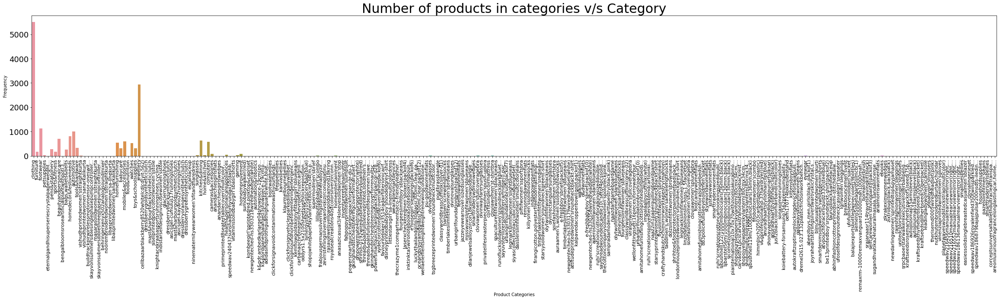

In [117]:
#filtering out some of the categories with count less than 10 
primary_category_count = Counter(primary_category)
print("The length of the unique Product Categories after some filtering is {}".format(len(primary_category_count)))

all_categories_temp=[]
count_temp=[]

for keys,vals in primary_category_count.items():
  all_categories_temp.append(keys)
  count_temp.append(vals)

plt.figure(figsize=(40,6))
plt.title("Number of products in categories v/s Category", fontsize=30)
plt.xlabel("Product Categories")
plt.ylabel("Frequency")
plt.xticks(fontsize=11,rotation=90)
plt.yticks(fontsize=18)
sns.barplot(x=all_categories_temp, y=count_temp)

From the above bargraph, we can clearly see that there is a lot of noise in the dataset as only the brand/description is sometimes mentioned in the Product Category. To visualise the relevant classes, a bargraph is plotted below that shows only those Product Categories which have at least 10 products

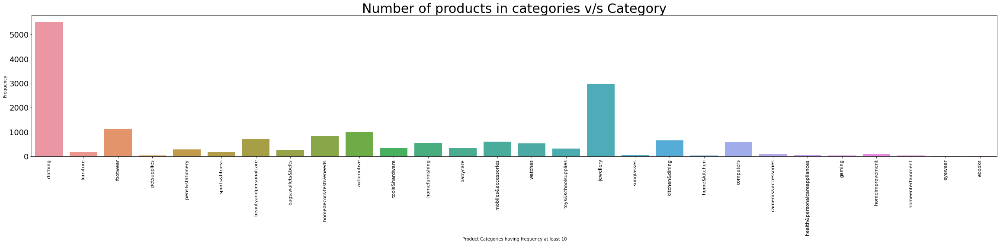

In [118]:
all_categories=[]
count=[]

for keys,vals in primary_category_count.items():
  #choosing only those categories which have at least 10 producrs
  if(vals>=10):
    all_categories.append(keys)
    count.append(vals)

plt.figure(figsize=(40,6))
plt.title("Number of products in categories v/s Category", fontsize=30)
plt.xlabel("Product Categories having frequency at least 10")
plt.ylabel("Frequency")
plt.xticks(fontsize=11,rotation=90)
plt.yticks(fontsize=18)
sns.barplot(x=all_categories, y=count)

In [119]:
#Combining the redundant categories

revised_categories = [None]*len(primary_category)

for i in range(len(primary_category)):
  if primary_category[i]=="homeimprovement" or primary_category[i]=="homedecor&festiveneeds" or primary_category[i]=='home&kitchen' or primary_category[i]=="kitchen&dining" or primary_category[i]=="homefurnishing" or primary_category[i]=="furniture" or primary_category[i]=="homeentertainment":
    revised_categories[i] = 'homefurnishing/kitchen'
  elif primary_category[i]=='pens&stationery':
    revised_categories[i] = 'toys&schoolsupplies'
  elif primary_category[i]=='gaming' or primary_category[i]=='cameras&accessories' or primary_category[i]=='computers' or primary_category[i]=="mobiles&accessories":
    revised_categories[i]='electronics'
  elif primary_category[i]=='health&personal care appliances' or primary_category[i]=='beautyandpersonalcare' or primary_category[i]=='eyewear' or primary_category[i]=='sunglasses' or primary_category[i]=='watches' or primary_category[i]=='bags,wallets&belts' or primary_category[i]=='health&personalcareappliances':
    revised_categories[i]='personalaccessories'
  else:
    revised_categories[i] = primary_category[i]

print("The length of the revised grouped categories are {}".format(len(Counter(revised_categories))))
print(revised_categories)

The length of the revised grouped categories are 250
['clothing', 'homefurnishing/kitchen', 'footwear', 'clothing', 'petsupplies', 'eternalgandhisuperseriescrystalpaperweight...', 'clothing', 'homefurnishing/kitchen', 'footwear', 'clothing', 'footwear', 'clothing', 'petsupplies', 'clothing', 'toys&schoolsupplies', 'clothing', 'homefurnishing/kitchen', 'footwear', 'clothing', 'homefurnishing/kitchen', 'petsupplies', 'clothing', 'clothing', 'footwear', 'petsupplies', 'clothing', 'sports&fitness', 'personalaccessories', 'clothing', 'clothing', 'bengalbloomsroseartificialplantwithpot(3...', 'clothing', 'toys&schoolsupplies', 'toys&schoolsupplies', 'toys&schoolsupplies', 'clothing', 'toys&schoolsupplies', 'clothing', 'personalaccessories', 'clothing', 'footwear', 'homefurnishing/kitchen', 'automotive', 'tools&hardware', "vishudhprintedwomen'sstraightkurta", "vishudhprintedwomen'sstraightkurta", "vishudhprintedwomen'sanarkalikurta", 'buildtrackpirwirelessmotionsensor-oneswit...', 'skayvonsum

In [120]:
#creating a new column in the dataframe which stores these revised grouped categories
products["primary_categories"] = revised_categories
products.head(10)

,Product name in Flipkart,product_category_tree,Retail Price in Flipkart,Discounted Price in Flipkart,description,brand,primary_categories
0,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",999.0,379.0,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing
1,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",32157.0,22646.0,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,FabHomeDecor,homefurnishing/kitchen
2,AW Bellies,"[""Footwear >> Women's Footwear >> Ballerinas >...",999.0,499.0,Key Features of AW Bellies Sandals Wedges Heel...,AW,footwear
3,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",699.0,267.0,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing
4,Sicons All Purpose Arnica Dog Shampoo,"[""Pet Supplies >> Grooming >> Skin & Coat Care...",220.0,210.0,Specifications of Sicons All Purpose Arnica Do...,Sicons,petsupplies
5,Eternal Gandhi Super Series Crystal Paper Weig...,"[""Eternal Gandhi Super Series Crystal Paper We...",430.0,430.0,Key Features of Eternal Gandhi Super Series Cr...,Eternal Gandhi,eternalgandhisuperseriescrystalpaperweight...
6,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",1199.0,479.0,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing
7,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",32157.0,22646.0,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,FabHomeDecor,homefurnishing/kitchen
8,"dilli bazaaar Bellies, Corporate Casuals, Casuals","[""Footwear >> Women's Footwear >> Ballerinas >...",699.0,349.0,"Key Features of dilli bazaaar Bellies, Corpora...",dilli bazaaar,footwear
9,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",1199.0,479.0,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing


In [121]:
temp_categories = list(dict.fromkeys(list(products.loc[:,'primary_categories'].values)))

considered_category = []
revised_category_count = {}
noise = {}
all_categories = {}

print("\n")
print("********************* THE FINAL CONSIDERED CATEGORIES AND THEIR COUNTS ARE AS FOLLOWS *************************")
print("\n")

for category in temp_categories:
  count = np.sum(products.loc[:, 'primary_categories'].values == category)
  all_categories[category]=count
    #a category is considered to be a main category only if the frequency of a product in that category is at least 10
  if(count>=10):
    print(category,count)
    revised_category_count[category] = count   
  else:
    noise[category] = count

for i in range(len(revised_categories)):
  if revised_categories[i] in revised_category_count:
    considered_category.append(1)
  else:
    considered_category.append(0)

print("\n")
print("********************* THE NOISE IN THE DATASET IS AS FOLLOWS *************************")
print("\n")
for keys,vals in noise.items():
  print(keys,vals)

print("\n")
print("********************* THE NOISE + PRIMARY CATEGORIES IN THE DATASET ARE AS FOLLOWS *************************")
print("\n")
for keys,vals in all_categories.items():
  print(keys,vals)



********************* THE FINAL CONSIDERED CATEGORIES AND THEIR COUNTS ARE AS FOLLOWS *************************


clothing 5503
homefurnishing/kitchen 2307
footwear 1123
petsupplies 30
toys&schoolsupplies 591
sports&fitness 166
personalaccessories 1578
automotive 1009
tools&hardware 333
babycare 324
electronics 1284
jewellery 2946
ebooks 15


********************* THE NOISE IN THE DATASET IS AS FOLLOWS *************************


eternalgandhisuperseriescrystalpaperweight... 1
bengalbloomsroseartificialplantwithpot(3... 1
vishudhprintedwomen'sstraightkurta 8
vishudhprintedwomen'sanarkalikurta 1
buildtrackpirwirelessmotionsensor-oneswit... 1
skayvonsummersiblesinglephasepumpcontroller... 1
masarasolidwomen'sstraightkurta 5
skayvonsubmersibblethreephasepumpcontroller... 1
behringerxenyx502analogsoundmixer 1
noorembroideredwomen'sstraightkurta 1
libasprintedwomen'sa-linekurta 1
libasprintedwomen'sanarkalikurta 1
food&nutrition 2
cellbazaarblackberry8520whitelcdlcd(yit-562) 1
dressberryg

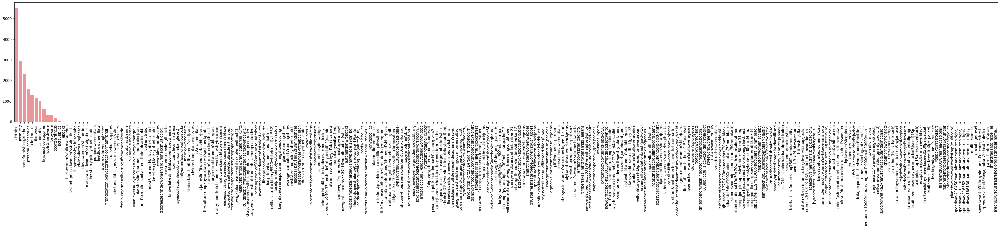

In [122]:
#Visualisation of the Noise + Primary Categories

all_categories = dict(sorted(all_categories.items(), key=lambda item: item[1], reverse=True))

all_categories_keys = list(all_categories.keys())
all_categories_freq = list(all_categories.values())

fig = plt.figure(figsize = (48, 6))
plt.xticks(rotation=90)
sns.barplot(x=all_categories_keys ,y=all_categories_freq)

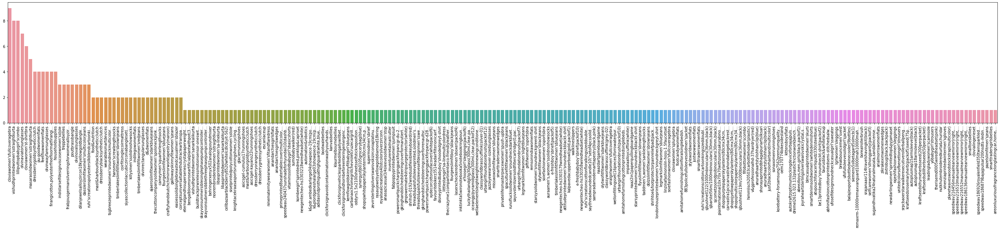

In [123]:
#Visualisation of only Noise in the dataset

noise = dict(sorted(noise.items(), key=lambda item: item[1], reverse=True))

noise_keys = list(noise.keys())
noise_freq = list(noise.values())

fig = plt.figure(figsize = (48, 6))
plt.xticks(rotation=90)
sns.barplot(x=noise_keys ,y=noise_freq)

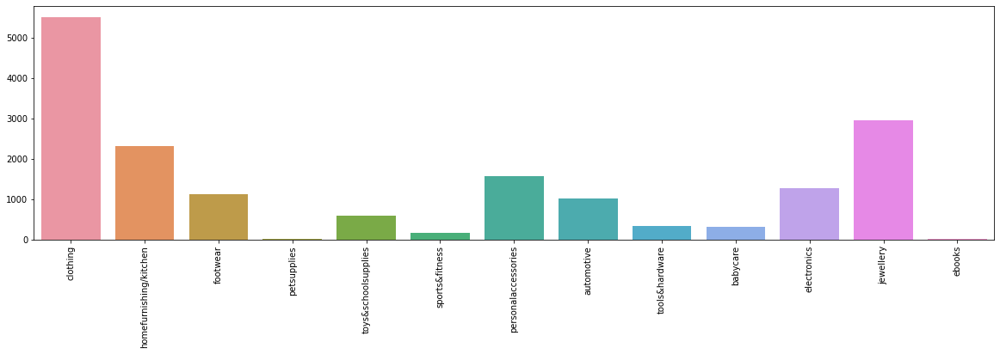

In [124]:
#Frequency Plot of the revised categories

categories = list(revised_category_count.keys())
frequency = list(revised_category_count.values())

fig = plt.figure(figsize = (20, 5))
plt.xticks(rotation=90)
sns.barplot(x=categories,y=frequency)

A main_category column is added to the dataset having binary values. Its value for a particular row is 1 if that product lies in any of the above mentioned 13 classes, otherwise it is 0.

In [125]:
products["main_category"] = considered_category
products.head(10)

,Product name in Flipkart,product_category_tree,Retail Price in Flipkart,Discounted Price in Flipkart,description,brand,primary_categories,main_category
0,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",999.0,379.0,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1
1,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",32157.0,22646.0,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,FabHomeDecor,homefurnishing/kitchen,1
2,AW Bellies,"[""Footwear >> Women's Footwear >> Ballerinas >...",999.0,499.0,Key Features of AW Bellies Sandals Wedges Heel...,AW,footwear,1
3,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",699.0,267.0,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1
4,Sicons All Purpose Arnica Dog Shampoo,"[""Pet Supplies >> Grooming >> Skin & Coat Care...",220.0,210.0,Specifications of Sicons All Purpose Arnica Do...,Sicons,petsupplies,1
5,Eternal Gandhi Super Series Crystal Paper Weig...,"[""Eternal Gandhi Super Series Crystal Paper We...",430.0,430.0,Key Features of Eternal Gandhi Super Series Cr...,Eternal Gandhi,eternalgandhisuperseriescrystalpaperweight...,0
6,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",1199.0,479.0,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1
7,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",32157.0,22646.0,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,FabHomeDecor,homefurnishing/kitchen,1
8,"dilli bazaaar Bellies, Corporate Casuals, Casuals","[""Footwear >> Women's Footwear >> Ballerinas >...",699.0,349.0,"Key Features of dilli bazaaar Bellies, Corpora...",dilli bazaaar,footwear,1
9,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",1199.0,479.0,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1


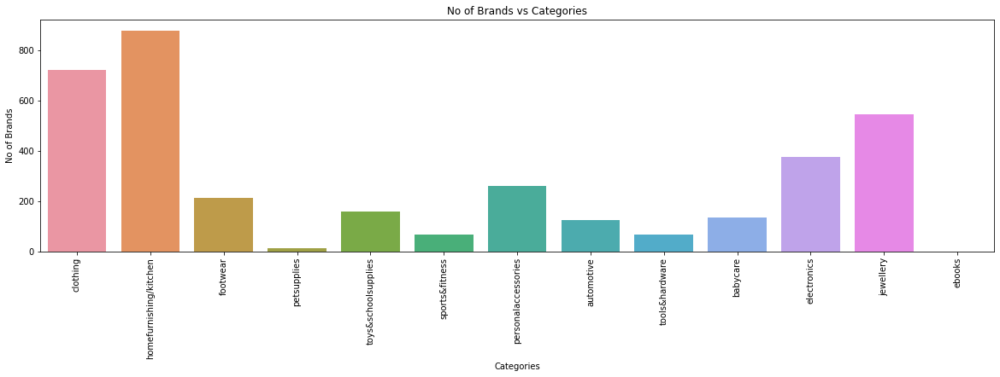

In [126]:
#Plotting the number of Brands per Category

temp_df = products.copy(deep=True)
temp_df = temp_df[temp_df['brand'].notna()]
temp_df = temp_df[temp_df["main_category"]==1]

#list containing the revised categories
category_list = []
#list containing the number of brands corresponding to that category
brand_freq_list = []

for category in categories:
  df = temp_df[temp_df["primary_categories"]==category]
  category_brand_count = list(dict.fromkeys(list(df.loc[:,'brand'].values)))
  category_list.append(category)
  brand_freq_list.append(len(category_brand_count))

#plotting the graph
fig = plt.figure(figsize = (20, 5))
plt.xticks(rotation=90)
plt.xlabel("Categories")
plt.ylabel("No of Brands")
plt.title("No of Brands vs Categories")
sns.barplot(x=category_list,y=brand_freq_list)

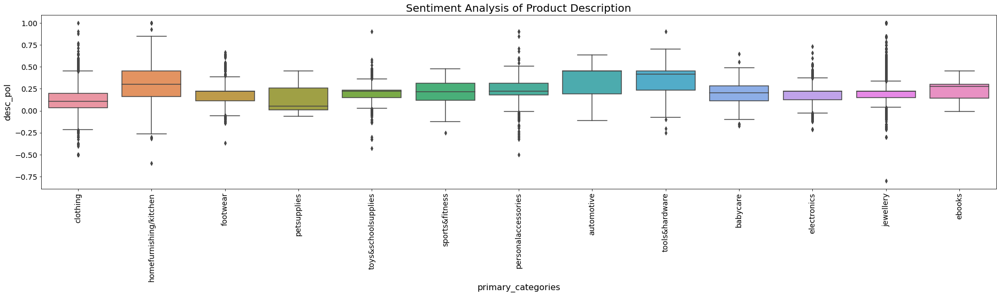

In [127]:
#Sentiment Analysis
#Sentiment analysis of the Product Description corresponding to each category. This is done by measuring the polarity of each product's description.

products['desc_pol']=products['description'].apply(lambda x : TextBlob(x).sentiment.polarity)

plt.figure(figsize=(32,6))
plt.title("Sentiment Analysis of Product Description", fontsize=20)
plt.xlabel("Polarity", fontsize=16)
plt.ylabel("Product Description", fontsize=16)
plt.xticks(fontsize=14,rotation=90)
plt.yticks(fontsize=14)
sns.boxplot(x="primary_categories", y='desc_pol', data=products[products['main_category']==1])

In [128]:
#Text Length Analysis

#finding the length of the description
max_desc_len = -1
desc_len_sum = 0
min_desc_len = maxsize

product_description = products["description"].tolist()

for i in range(len(product_description)):
  try:
    max_desc_len = max(max_desc_len,len(product_description[i]))
    min_desc_len = min(min_desc_len,len(product_description[i]))
    desc_len_sum+=len(product_description[i])
  except:
    pass

print("Max description length is {}.".format(max_desc_len))
print("Min description length is {}.".format(min_desc_len))
print("Average description length is {}.".format(desc_len_sum/len(product_description)))

Max description length is 5309.
Min description length is 74.
Average description length is 439.53264154170705.


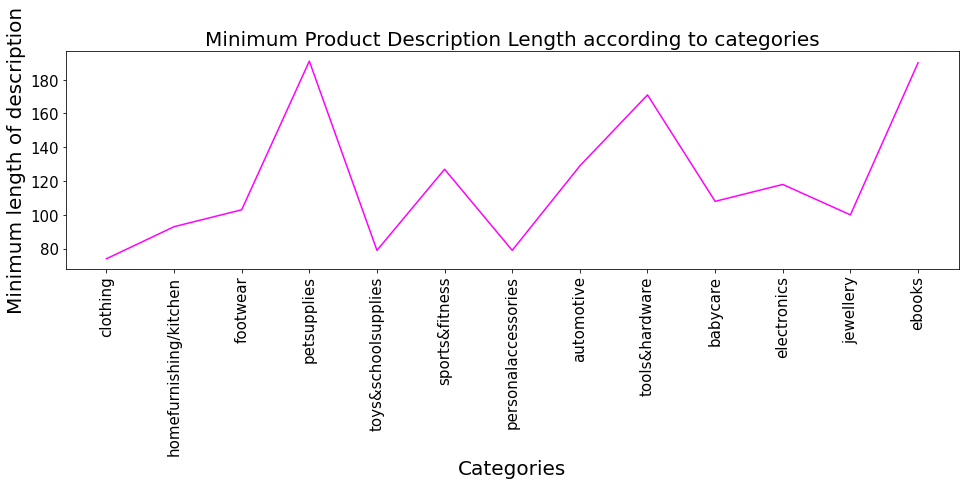

In [129]:
#Visualisation of the Minimum description length across all the categories

min_len = []
x = []

for category in temp_categories:
  temp_df = products[products["primary_categories"]==category]
  temp_df = temp_df[temp_df["main_category"]==1]
  try:
    temp_min_len = min(temp_df["description"].str.len())
    x.append(category)
    min_len.append(temp_min_len)
  except:
    pass
  

plt.figure(figsize=(16,4))
plt.title("Minimum Product Description Length according to categories", fontsize=20)
plt.ylabel("Minimum length of description", fontsize=20)
plt.xlabel("Categories", fontsize=20)
plt.xticks(fontsize=15,rotation=90)
plt.yticks(fontsize=15)
plt.plot(x,min_len, color = "magenta")

From the graph above we can see that there are discrepancies in the minimum length across all the categories. pet supplies and ebooks have a minimum length almost greater than 180 while clothing has the minimum length.

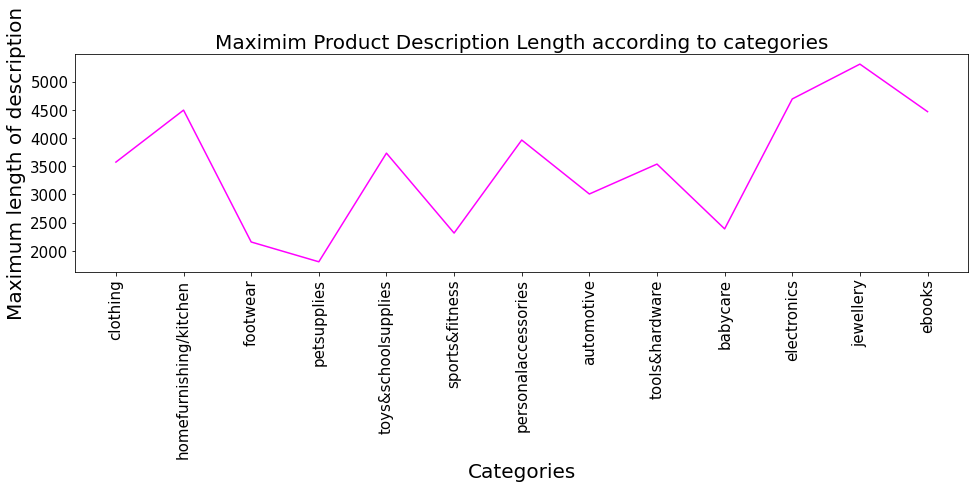

In [130]:
#Visualisation of the Maximum description length across all the categories

max_len = []
x = []

for category in temp_categories:
  temp_df = products[products["primary_categories"]==category]
  temp_df = temp_df[temp_df["main_category"]==1]
  try:
    temp_max_len = max(temp_df["description"].str.len())
    x.append(category)
    max_len.append(temp_max_len)
  except:
    pass
  

plt.figure(figsize=(16,4))
plt.title("Maximim Product Description Length according to categories", fontsize=20)
plt.ylabel("Maximum length of description", fontsize=20)
plt.xlabel("Categories", fontsize=20)
plt.xticks(fontsize=15,rotation=90)
plt.yticks(fontsize=15)
plt.plot(x,max_len, color = "magenta")

From the graph above we can see that almost all the product description lengths are greater than 2000 with jewellary category having the greatest length for product description (greater than 5000)


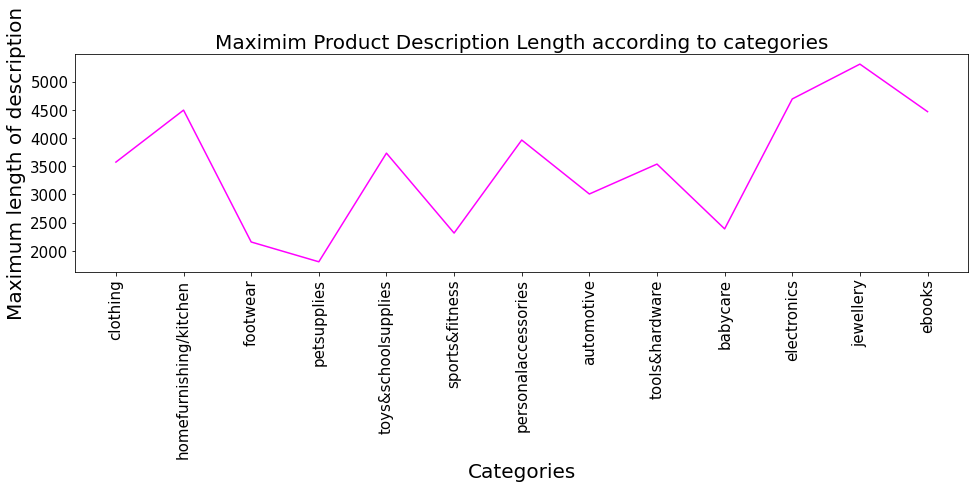

In [131]:
#Visualisation of the Maximum description length across all the categories

max_len = []
x = []

for category in temp_categories:
  temp_df = products[products["primary_categories"]==category]
  temp_df = temp_df[temp_df["main_category"]==1]
  try:
    temp_max_len = max(temp_df["description"].str.len())
    x.append(category)
    max_len.append(temp_max_len)
  except:
    pass
  

plt.figure(figsize=(16,4))
plt.title("Maximim Product Description Length according to categories", fontsize=20)
plt.ylabel("Maximum length of description", fontsize=20)
plt.xlabel("Categories", fontsize=20)
plt.xticks(fontsize=15,rotation=90)
plt.yticks(fontsize=15)
plt.plot(x,max_len, color = "magenta")

From the graph above we can see that almost all the product description lengths are greater than 2000 with jewellary category having the greatest length for product description (greater than 5000)


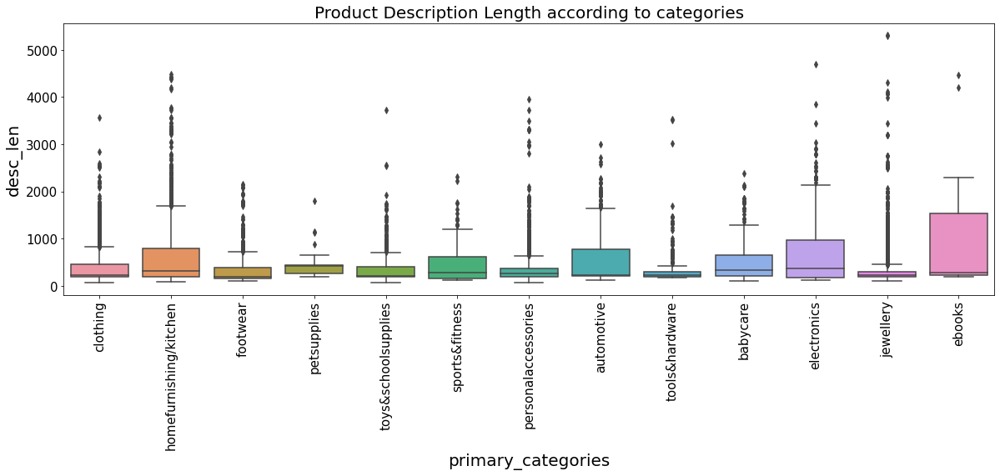

In [132]:
#Boxplot of the Average description length across all the categories

products["desc_len"] = products["description"].str.len()

plt.figure(figsize=(20,6))
plt.title("Product Description Length according to categories", fontsize=20)
plt.ylabel("Average of length of description", fontsize=20)
plt.xlabel("Number of Categories", fontsize=20)
plt.xticks(fontsize=15,rotation=90)
plt.yticks(fontsize=15)
sns.boxplot(x="primary_categories", y='desc_len', data=products[products['main_category']==1])

From the boxplot, we can see that the average length for all the categories lies more or less around 1000 words. I decided to not go with a certain minimum/maximum words threshold to prevent loss of information.


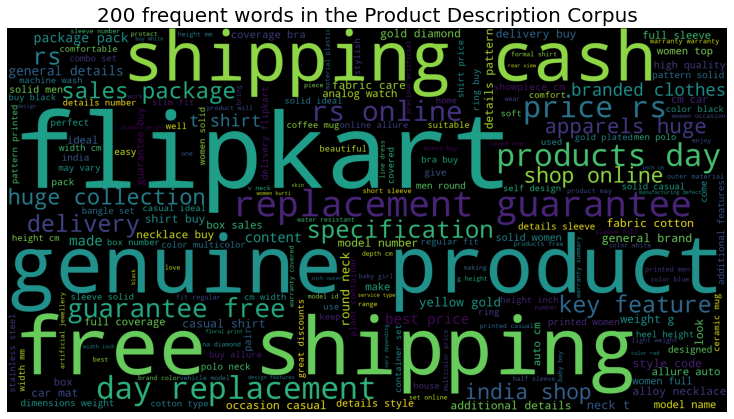

In [133]:
#Word Clouds

product_content = ""

for i in products["description"]: 
    i = str(i) 
    separate = i.split() 
    for j in range(len(separate)): 
        separate[j] = separate[j].lower() 
      
    product_content += " ".join(separate)+" "

stop_words = set(STOPWORDS)
final_wordcloud = WordCloud(width = 3000, height = 1600, 
                            max_words=200,
                            background_color ='black', 
                            stopwords = stop_words, 
                            min_font_size = 10).generate(product_content)

plt.figure(figsize = (10, 10), facecolor = None) 
plt.title("200 frequent words in the Product Description Corpus", fontsize=20)
plt.imshow(final_wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show()

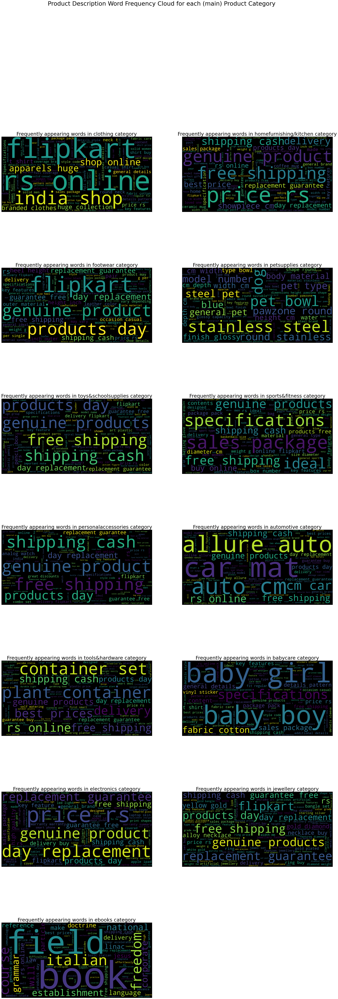

In [134]:
#Word Cloud for each Category in the Corpus

plt.figure(figsize = (36, 100), facecolor = None) 
plt.suptitle("Product Description Word Frequency Cloud for each (main) Product Category",fontsize=36)
j = math.ceil(len(categories)/2)

for i,c in enumerate(categories):
  temp = i+1
  desc = products[products['primary_categories']==c].description.str.lower().values
  plt.subplot(j, 2, temp).set_title("Frequently appearing words in {} category".format(c), fontsize=30)
  word_cloud = WordCloud(background_color="black",max_words=100,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
  word_cloud.generate(" ".join(desc))
  plt.axis("off")
  plt.imshow(word_cloud)
plt.show()

In [135]:
#Character Contraction

corpus = ' '.join(products['description']).lower()
characters = Counter(corpus)
sorted(characters.items(), key=lambda i: i[1], reverse=True)

total=0
for i in ascii_letters+punctuation+digits:
  total+=characters[i]

print("The % of data consisting of only English Characters is {}.".format(100*total/len(' '.join(products['description']))))
print("\n")
print(characters)

The % of data consisting of only English Characters is 82.54099753562447.


Counter({' ': 1303257, 'e': 664539, 'a': 488535, 'o': 454480, 't': 430770, 'i': 425532, 'r': 424917, 'n': 394391, 's': 380924, 'l': 336553, 'c': 259085, 'd': 215439, 'h': 188873, 'p': 184311, 'u': 174885, 'f': 160637, 'm': 156897, 'y': 137694, 'g': 135728, 'b': 110839, '.': 91270, 'w': 84347, 'k': 70256, 'v': 53338, ',': 41369, '0': 32338, '1': 28831, '-': 27391, '\t': 23349, '9': 21749, '3': 19141, '\n': 19093, '2': 18392, ':': 18149, '5': 15294, 'x': 14744, "'": 14488, '4': 12770, 'j': 10025, 'z': 9922, '8': 8395, ')': 7951, '6': 7948, '(': 7682, '7': 6807, 'q': 6745, '!': 6321, '&': 5926, '/': 4141, '"': 1486, '%': 1130, '_': 1005, '\xa0': 747, '*': 725, '\r': 690, '#': 672, '’': 437, '•': 407, ';': 402, '?': 386, '+': 378, '|': 241, '@': 147, 'é': 138, '=': 117, '”': 115, '�': 87, '“': 82, '–': 73, 'â': 72, '¢': 43, '®': 42, '…': 39, '\x80': 35, '°': 33, ']': 21, 'ã': 21, '[': 18, '✔': 15, '‘': 14, '±': 12,

In [136]:
# getting all the words ending an apostrophe and single letter
contractions = Counter(re.findall("[a-z]+'[a-z]+", corpus))
apostrophe_end = sorted(contractions.items(), key=lambda i: i[1], reverse=True)
print("\n")
print(apostrophe_end)

# getting all the words starting with a single letter and an apostrophe
contractions=Counter(re.findall("[a-z]'[a-z]+", corpus))
apostrophe_start = sorted(contractions.items(), key=lambda i: i[1], reverse=True)
print("\n")
print(apostrophe_start)

#getting all the URLS
urls = re.findall('\(*http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+#]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))*', corpus)
print("\n")
print(urls)



[("women's", 7335), ("men's", 3191), ("girl's", 1062), ("boy's", 790), ("don't", 159), ("you're", 125), ("product's", 96), ("it's", 95), ("doesn't", 52), ("nod'r", 33), ("customer's", 32), ("bra's", 31), ("ruhi's", 30), ("won't", 29), ("you'll", 29), ("d'clair", 26), ("manufacturer's", 25), ("they're", 25), ("adapter's", 24), ("laptop's", 24), ("can't", 22), ("layer'r", 22), ("l'appel", 22), ("monitor's", 19), ("india's", 19), ("today's", 18), ("woman's", 17), ("bras's", 16), ("car's", 15), ("phone's", 14), ("dede's", 13), ("kid's", 12), ("baby's", 12), ("you'd", 11), ("jerry's", 11), ("world's", 10), ("company's", 10), ("model's", 9), ("scheffer's", 9), ("combo's", 9), ("what's", 8), ("wellworth's", 8), ("one's", 8), ("child's", 8), ("l'elegantae", 8), ("lord's", 8), ("computer's", 8), ("vehicle's", 7), ("finger's", 7), ("seema's", 7), ("viewer's", 7), ("there's", 7), ("buyer's", 7), ("man's", 6), ("shirt's", 6), ("i'm", 6), ("chef'n", 6), ("kb's", 6), ("wearer's", 6), ("anand's", 6

In [137]:
custom_contracts = {
    "women's" : "women",
    "men's" : "men",
    "girl's" : "girl",
    "boy's" : "boy",
    "don't" : "do not",
    "product's" : "product",
    "it's" : "its",
    "bra's" : "bras",
    "won't": "will not",
    "doesn't" : "does not",
    "l's" : " ",
    "n's" : " ",
    "y's" : " ",
    "n't" : "not",
    "r's" : "rs",
    "u're" : "your",
    "a's" : " ",
    "e's": " "
}

custom_stopwords = [w for w in set(stopwords.words("english"))]
custom_stopwords += list(punctuation)
stopwords_dataset = ["replacement","shipping","delivery","cash", "rs", "flipkart", "genuine", "details", "guarantee","free", "genuine", "flipkart.com"]
custom_stopwords.extend(stopwords_dataset)
wordnet_lemmatizer = WordNetLemmatizer()

In [138]:
def clean(text):

  for i in range(len(text)):
    text[i] = text[i].lower()
    text[i] = text[i].replace("\n"," ")
    for keys,values in custom_contracts.items():
      text[i] = text[i].replace(keys,values)
    text[i] = re.sub("[a-z]'[a-z]+", " ", text[i])
    #removing the extra whitespaces
    text[i] = re.sub(' +', ' ', text[i])
    #keeping only the ascii characters -> handles emoticons, letters from other languages, etc
    text[i] = re.sub(r'[^\x00-\x7F]+',' ', text[i])
    #removing the urls
    text[i] = re.sub('[(]?http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+#]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F])/)*', ' ', text[i])
    text[i] = ''.join([j for j in text[i] if not j.isdigit()])
    text[i] = text[i].split()
    text[i] = ' '.join([word for word in text[i] if word not in custom_stopwords])
    #removing the punctuations
    text[i] = re.sub(r'[^\w\s]', '', text[i])
    #lemmatization
    text[i] = [wordnet_lemmatizer.lemmatize(w) for w in word_tokenize(text[i])]
    #removing the words which have a length less than 3
    text[i] = [word for word in text[i] if len(word)>=3]
  
  return text

raw_description = products["description"].tolist()
cleaned_description = clean(raw_description)
print(cleaned_description[:5])

[['key', 'feature', 'alisha', 'solid', 'woman', 'cycling', 'short', 'cotton', 'lycra', 'navy', 'red', 'navyspecifications', 'alisha', 'solid', 'woman', 'cycling', 'short', 'short', 'number', 'content', 'sale', 'package', 'pack', 'fabric', 'cotton', 'lycra', 'type', 'cycling', 'short', 'general', 'pattern', 'solid', 'ideal', 'woman', 'fabric', 'care', 'gentle', 'machine', 'wash', 'lukewarm', 'water', 'bleach', 'additional', 'style', 'code', 'altht_p_', 'box', 'short'], ['fabhomedecor', 'fabric', 'double', 'sofa', 'bed', 'finish', 'color', 'leatherette', 'black', 'mechanism', 'type', 'pull', 'out', 'price', 'fine', 'deep', 'seating', 'experience', 'save', 'space', 'new', 'click', 'clack', 'sofa', 'bed', 'easy', 'fold', 'vice', 'versa', 'simple', 'click', 'clack', 'mechanism', 'chrome', 'leg', 'mango', 'wood', 'frame', 'long', 'term', 'durability', 'double', 'cushioned', 'sofa', 'bed', 'provide', 'extra', 'softness', 'make', 'fine', 'seating', 'experience', 'double', 'bed', 'easily', 'sle

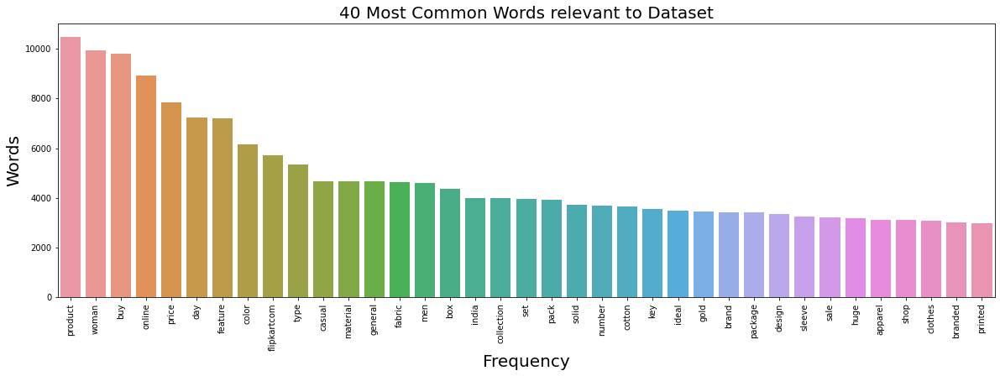

In [139]:
#Visualisation of the most common words

corpus = []
for text in cleaned_description:
  for word in text:
    corpus.append(word)

counter = Counter(corpus)
most=counter.most_common()
x, y = [], []
for word,count in most[:40]:
  if (word not in custom_stopwords):
    x.append(word)
    y.append(count)

plt.figure(figsize=(20,6))
plt.title("40 Most Common Words relevant to Dataset", fontsize=20)
plt.ylabel("Words", fontsize=20)
plt.xlabel("Frequency", fontsize=20)
plt.xticks(rotation=90)            
sns.barplot(x=x,y=y)

In [140]:
temp_cleaned_description = [" ".join(sentence) for sentence in cleaned_description]
products["cleaned_desc"] = temp_cleaned_description
products.head(10)

,Product name in Flipkart,product_category_tree,Retail Price in Flipkart,Discounted Price in Flipkart,description,brand,primary_categories,main_category,desc_pol,desc_len,cleaned_desc
0,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",999.0,379.0,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1,0.143750,410,key feature alisha solid woman cycling short c...
1,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",32157.0,22646.0,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,FabHomeDecor,homefurnishing/kitchen,1,0.113814,4433,fabhomedecor fabric double sofa bed finish col...
2,AW Bellies,"[""Footwear >> Women's Footwear >> Ballerinas >...",999.0,499.0,Key Features of AW Bellies Sandals Wedges Heel...,AW,footwear,1,0.027778,650,key feature belly sandal wedge heel casualsaw ...
3,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",699.0,267.0,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1,0.122917,403,key feature alisha solid woman cycling short c...
4,Sicons All Purpose Arnica Dog Shampoo,"[""Pet Supplies >> Grooming >> Skin & Coat Care...",220.0,210.0,Specifications of Sicons All Purpose Arnica Do...,Sicons,petsupplies,1,0.050000,248,specification sicons purpose arnica dog shampo...
5,Eternal Gandhi Super Series Crystal Paper Weig...,"[""Eternal Gandhi Super Series Crystal Paper We...",430.0,430.0,Key Features of Eternal Gandhi Super Series Cr...,Eternal Gandhi,eternalgandhisuperseriescrystalpaperweight...,0,0.322727,872,key feature eternal gandhi super series crysta...
6,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",1199.0,479.0,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1,0.127778,416,key feature alisha solid woman cycling short c...
7,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",32157.0,22646.0,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,FabHomeDecor,homefurnishing/kitchen,1,0.135063,4385,fabhomedecor fabric double sofa bed finish col...
8,"dilli bazaaar Bellies, Corporate Casuals, Casuals","[""Footwear >> Women's Footwear >> Ballerinas >...",699.0,349.0,"Key Features of dilli bazaaar Bellies, Corpora...",dilli bazaaar,footwear,1,-0.032143,428,key feature dilli bazaaar belly corporate casu...
9,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",1199.0,479.0,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1,0.098333,419,key feature alisha solid woman cycling short c...


In [141]:
#Converting the Primary Category of all Noise datapoints into Noise label

products.loc[products['main_category'] == 0, 'primary_categories'] = "noise"
products.sample(10)

,Product name in Flipkart,product_category_tree,Retail Price in Flipkart,Discounted Price in Flipkart,description,brand,primary_categories,main_category,desc_pol,desc_len,cleaned_desc
7881,Minerva Naturals Plant Container Set,"[""Tools & Hardware >> Tools >> Gardening Tools...",350.0,250.0,Minerva Naturals Plant Container Set (Pack of ...,Minerva Naturals,tools&hardware,1,0.500000,257,minerva natural plant container set pack plast...
1425,Pruto Lace Up,"[""Footwear >> Men's Footwear >> Formal Shoes >...",1740.0,1740.0,Key Features of Pruto Lace Up Ocassion :Formal...,Pruto,footwear,1,0.025850,724,key feature pruto lace ocassion formal closure...
7548,Yuccabe Italia Stoic Green Self Watering Plant...,"[""Tools & Hardware >> Tools >> Gardening Tools...",7794.0,3399.0,Buy Yuccabe Italia Stoic Green Self Watering P...,Yuccabe Italia,tools&hardware,1,0.233333,252,buy yuccabe italia stoic green self watering p...
6155,Aardee Trendy Design Art Thick Fabric Pencil Box,"[""Toys & School Supplies >> School Supplies >>...",500.0,450.0,Flipkart.com: Buy Aardee Trendy Design Art Thi...,NaN,toys&schoolsupplies,1,0.200000,188,flipkartcom buy aardee trendy design art thick...
10844,Antilia Femme Women's Solid Casual Reversible ...,"[""Clothing >> Women's Clothing >> Western Wear...",1099.0,445.0,Antilia Femme Women's Solid Casual Reversible ...,Regular,clothing,1,-0.095833,232,antilia femme woman solid casual reversible sh...
8507,GREENWICH Baby Girl's Black Jeggings,"[""Baby Care >> Infant Wear >> Baby Girls' Clot...",225.0,225.0,Key Features of GREENWICH Baby Girl's Black Je...,GREENWICH,babycare,1,0.044872,660,key feature greenwich baby girl black jeggings...
10338,Archi Collection Alloy Jewel Set,"[""Jewellery >> Jewellery Sets""]",1500.0,370.0,Archi Collection Alloy Jewel Set - Buy Archi C...,Archi Collection,jewellery,1,0.225000,193,archi collection alloy jewel set buy archi col...
2015,Vaishna Pro Women's Full Coverage Bra,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",720.0,253.0,Vaishna Pro Women's Full Coverage Bra\n ...,Multicolor,clothing,1,0.342308,479,vaishna pro woman full coverage bra price vais...
5716,DressBerry Enamel Plated Metal Necklace,"[""Jewellery >> Necklaces & Chains >> Necklaces""]",399.0,219.0,DressBerry Enamel Plated Metal Necklace - Buy ...,DressBerry,jewellery,1,0.225000,207,dressberry enamel plated metal necklace buy dr...
14979,NKP Cotton Bath Towel,"[""Home Furnishing >> Bath Linen >> Towels""]",599.0,549.0,Buy NKP Cotton Bath Towel at Rs. 549 at Flipka...,NKP,homefurnishing/kitchen,1,0.300000,109,buy nkp cotton bath towel flipkartcom product ...


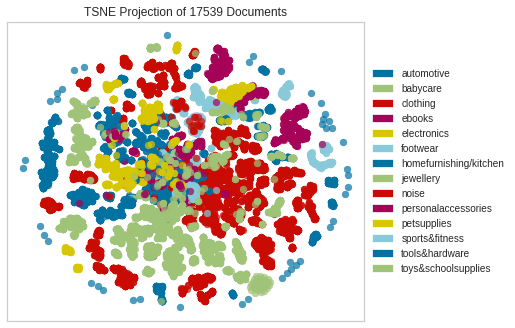

In [142]:
#Visualization of the Overlapping of classes using TSNE Plots

from yellowbrick.text import TSNEVisualizer

# creating the document vectors
tfidf = TfidfVectorizer()

description = tfidf.fit_transform(products["cleaned_desc"])
categories_ = products["primary_categories"]

# creating the visualizer
tsne = TSNEVisualizer()
tsne.fit_transform(description, categories_)
tsne.poof()
plt.show()

In [143]:
#Dataframe consisting of categories and their counts

temp_categories = {
    'primary_category':categories,
    'count':frequency
}


temp_categories['primary_category'].append('noise')
temp_categories['count'].append(len(noise))
category_df = pd.DataFrame(temp_categories)
category_df = category_df.sort_values(by = 'count', ascending=False)
category_df = category_df.reset_index(drop=True)
category_df

,primary_category,count
0,clothing,5503
1,jewellery,2946
2,homefurnishing/kitchen,2307
3,personalaccessories,1578
4,electronics,1284
5,footwear,1123
6,automotive,1009
7,toys&schoolsupplies,591
8,tools&hardware,333
9,babycare,324


In [144]:
#saving the unbalanced dataframe into drive

with open('/content/drive/MyDrive/Flipkart_unbalanced_products.csv', 'w') as f:
  products.to_csv(f)

In [145]:
#Oversampling
# a copy of the unbalanced dataset is made on which further work is done
balanced_df = products.copy(deep=True)
balanced2_df = products.copy(deep=True)
balanced_df

,Product name in Flipkart,product_category_tree,Retail Price in Flipkart,Discounted Price in Flipkart,description,brand,primary_categories,main_category,desc_pol,desc_len,cleaned_desc
0,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",999.0,379.0,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1,0.143750,410,key feature alisha solid woman cycling short c...
1,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",32157.0,22646.0,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,FabHomeDecor,homefurnishing/kitchen,1,0.113814,4433,fabhomedecor fabric double sofa bed finish col...
2,AW Bellies,"[""Footwear >> Women's Footwear >> Ballerinas >...",999.0,499.0,Key Features of AW Bellies Sandals Wedges Heel...,AW,footwear,1,0.027778,650,key feature belly sandal wedge heel casualsaw ...
3,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",699.0,267.0,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1,0.122917,403,key feature alisha solid woman cycling short c...
4,Sicons All Purpose Arnica Dog Shampoo,"[""Pet Supplies >> Grooming >> Skin & Coat Care...",220.0,210.0,Specifications of Sicons All Purpose Arnica Do...,Sicons,petsupplies,1,0.050000,248,specification sicons purpose arnica dog shampo...
...,...,...,...,...,...,...,...,...,...,...,...
17534,Wallmantra Large Vinyl Stickers Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",3559.0,1369.0,Buy Wallmantra Large Vinyl Stickers Sticker fo...,Wallmantra,babycare,1,0.371429,210,buy wallmantra large vinyl sticker sticker onl...
17535,Wallmantra Extra Large Vinyl Stickers Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",3016.0,2194.0,Buy Wallmantra Extra Large Vinyl Stickers Stic...,Wallmantra,babycare,1,0.278571,222,buy wallmantra extra large vinyl sticker stick...
17536,Wallmantra Extra Large Vinyl Stickers Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",7069.0,2719.0,Buy Wallmantra Extra Large Vinyl Stickers Stic...,Wallmantra,babycare,1,0.278571,222,buy wallmantra extra large vinyl sticker stick...
17537,Wallmantra Extra Large Vinyl Stickers Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",5795.0,2229.0,Buy Wallmantra Extra Large Vinyl Stickers Stic...,Wallmantra,babycare,1,0.278571,222,buy wallmantra extra large vinyl sticker stick...


In [146]:
from sklearn.utils import resample

balanced_df = balanced_df.loc[balanced_df['main_category'] == 1]

final_balanced_df = {category: balanced_df[balanced_df['primary_categories']==category] for category in set(balanced_df['primary_categories'])}

train_df = pd.concat([resample(data, n_samples=3000, replace=True, random_state=42) for data in final_balanced_df.values()])
train_df

,Product name in Flipkart,product_category_tree,Retail Price in Flipkart,Discounted Price in Flipkart,description,brand,primary_categories,main_category,desc_pol,desc_len,cleaned_desc
5417,Alex's Barbie Series Barbie Doll Art Plastic P...,"[""Toys & School Supplies >> School Supplies >>...",799.0,299.0,Flipkart.com: Buy Alex's Barbie Series Barbie ...,NaN,toys&schoolsupplies,1,0.225000,195,flipkartcom buy ale barbie series barbie doll ...
13643,Platignum Carnaby Street Ball Pen,"[""Pens & Stationery >> Pens >> Ball Pens >> Pl...",695.0,695.0,Platignum Carnaby Street Ball Pen (Blue)\n ...,Platignum,toys&schoolsupplies,1,0.362835,1420,platignum carnaby street ball pen blue price c...
6316,Aardee Varsity Design Art Thick fabric Pencil Box,"[""Toys & School Supplies >> School Supplies >>...",350.0,299.0,Aardee Varsity Design Art Thick fabric Pencil ...,NaN,toys&schoolsupplies,1,0.016667,207,aardee varsity design art thick fabric pencil ...
5429,Outshiny Eagle Printed Art Polyester Pencil Box,"[""Toys & School Supplies >> School Supplies >>...",199.0,149.0,Outshiny Eagle Printed Art Polyester Pencil Bo...,NaN,toys&schoolsupplies,1,0.330000,786,outshiny eagle printed art polyester pencil bo...
5206,Starmark BTS Flowers Art Polyester Pencil Box,"[""Toys & School Supplies >> School Supplies >>...",179.0,99.0,Flipkart.com: Buy Starmark BTS Flowers Art Pol...,NaN,toys&schoolsupplies,1,0.225000,184,flipkartcom buy starmark bts flower art polyes...
...,...,...,...,...,...,...,...,...,...,...,...
2821,fourgee Slim Fit Women's Blue Jeans,"[""Clothing >> Women's Clothing >> Western Wear...",2000.0,619.0,Key Features of fourgee Slim Fit Women's Blue ...,fourgee,clothing,1,0.263889,711,key feature fourgee slim fit woman blue jean r...
10578,Westhreads Women's Solid Casual Shirt,"[""Clothing >> Women's Clothing >> Western Wear...",799.0,499.0,Westhreads Women's Solid Casual Shirt - Buy Bl...,Relaxed,clothing,1,-0.075000,202,westhreads woman solid casual shirt buy blue w...
9876,Trendz Today Casual Full Sleeve Printed Women'...,"[""Clothing >> Women's Clothing >> Western Wear...",1199.0,1199.0,Trendz Today Casual Full Sleeve Printed Women'...,NaN,clothing,1,0.093333,232,trendz today casual full sleeve printed woman ...
725,Akshadha Girl's A-line Dress,"[""Clothing >> Kids' Clothing >> Girls Wear >> ...",799.0,799.0,Akshadha Girl's A-line Dress - Buy Red Akshadh...,NaN,clothing,1,0.100000,183,akshadha girl aline dress buy red akshadha gir...


In [147]:
#Dataframe showing the count of the new oversampled datapoints

temp_balanced_categories = {
    'primary_category':[],
    'count':[]
}

for category in categories:
  count = np.sum(train_df.loc[:, 'primary_categories'].values == category)
  temp_balanced_categories['primary_category'].append(category)
  temp_balanced_categories['count'].append(count)

category_balanced_df = pd.DataFrame(temp_balanced_categories)
category_balanced_df = category_balanced_df.sort_values(by = 'count', ascending=False)
category_balanced_df = category_balanced_df.reset_index(drop=True)
category_balanced_df

,primary_category,count
0,clothing,3000
1,homefurnishing/kitchen,3000
2,footwear,3000
3,petsupplies,3000
4,toys&schoolsupplies,3000
5,sports&fitness,3000
6,personalaccessories,3000
7,automotive,3000
8,tools&hardware,3000
9,babycare,3000


In [148]:
#saving the oversampling balanced dataframe into drive

with open('/content/drive/MyDrive/Flipkart_oversampling_balanced_products.csv', 'w') as f:
  train_df.to_csv(f)

In [149]:
# Undersampling
balanced2_df

,Product name in Flipkart,product_category_tree,Retail Price in Flipkart,Discounted Price in Flipkart,description,brand,primary_categories,main_category,desc_pol,desc_len,cleaned_desc
0,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",999.0,379.0,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1,0.143750,410,key feature alisha solid woman cycling short c...
1,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",32157.0,22646.0,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,FabHomeDecor,homefurnishing/kitchen,1,0.113814,4433,fabhomedecor fabric double sofa bed finish col...
2,AW Bellies,"[""Footwear >> Women's Footwear >> Ballerinas >...",999.0,499.0,Key Features of AW Bellies Sandals Wedges Heel...,AW,footwear,1,0.027778,650,key feature belly sandal wedge heel casualsaw ...
3,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",699.0,267.0,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1,0.122917,403,key feature alisha solid woman cycling short c...
4,Sicons All Purpose Arnica Dog Shampoo,"[""Pet Supplies >> Grooming >> Skin & Coat Care...",220.0,210.0,Specifications of Sicons All Purpose Arnica Do...,Sicons,petsupplies,1,0.050000,248,specification sicons purpose arnica dog shampo...
...,...,...,...,...,...,...,...,...,...,...,...
17534,Wallmantra Large Vinyl Stickers Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",3559.0,1369.0,Buy Wallmantra Large Vinyl Stickers Sticker fo...,Wallmantra,babycare,1,0.371429,210,buy wallmantra large vinyl sticker sticker onl...
17535,Wallmantra Extra Large Vinyl Stickers Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",3016.0,2194.0,Buy Wallmantra Extra Large Vinyl Stickers Stic...,Wallmantra,babycare,1,0.278571,222,buy wallmantra extra large vinyl sticker stick...
17536,Wallmantra Extra Large Vinyl Stickers Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",7069.0,2719.0,Buy Wallmantra Extra Large Vinyl Stickers Stic...,Wallmantra,babycare,1,0.278571,222,buy wallmantra extra large vinyl sticker stick...
17537,Wallmantra Extra Large Vinyl Stickers Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",5795.0,2229.0,Buy Wallmantra Extra Large Vinyl Stickers Stic...,Wallmantra,babycare,1,0.278571,222,buy wallmantra extra large vinyl sticker stick...


In [150]:
# the datapoints are separated out into jewellary, clothing and non jewellary and clothing entries

jewellary_df = balanced2_df.loc[balanced2_df['primary_categories'] == 'jewellery']
clothing_df = balanced2_df.loc[balanced2_df['primary_categories'] == 'clothing']
not_jewellary_clothing = balanced2_df.loc[balanced2_df['primary_categories'] != 'clothing']
not_jewellary_clothing = not_jewellary_clothing.loc[not_jewellary_clothing['primary_categories'] != 'jewellery']
not_jewellary_clothing = not_jewellary_clothing.loc[not_jewellary_clothing['main_category'] == 1]

print(jewellary_df.shape, clothing_df.shape, not_jewellary_clothing.shape)

(2946, 11) (5503, 11) (8760, 11)


In [151]:
clothing_down = resample(clothing_df, replace = False, n_samples = 1700, random_state = 42)
jewellary_down = resample(jewellary_df, replace = False, n_samples = 1700, random_state = 42)

print(clothing_down.shape, jewellary_down.shape)

(1700, 11) (1700, 11)


In [152]:
undersampled_bal = pd.concat([clothing_down, jewellary_down, not_jewellary_clothing])
undersampled_bal = undersampled_bal.reset_index(drop=True)
undersampled_bal

,Product name in Flipkart,product_category_tree,Retail Price in Flipkart,Discounted Price in Flipkart,description,brand,primary_categories,main_category,desc_pol,desc_len,cleaned_desc
0,Northern Lights Striped Men's Round Neck T-Shirt,"[""Clothing >> Men's Clothing >> T-Shirts >> No...",999.0,599.0,Northern Lights Striped Men's Round Neck T-Shi...,NaN,clothing,1,-0.007143,232,northern light striped men round neck tshirt b...
1,ShowTime Women's T-Shirt Bra,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",599.0,140.0,ShowTime Women's T-Shirt Bra - Buy Black ShowT...,Black,clothing,1,0.058333,185,showtime woman tshirt bra buy black showtime w...
2,Cotton Fab Printed Women's Maternity Wear Kurti,"[""Clothing >> Women's Clothing >> Maternity We...",3900.0,780.0,Key Features of Cotton Fab Printed Women's Mat...,Cotton Fab,clothing,1,0.316667,319,key feature cotton fab printed woman maternity...
3,Inmark Men's Checkered Formal Shirt,"[""Clothing >> Men's Clothing >> Shirts >> Form...",1099.0,660.0,Inmark Men's Checkered Formal Shirt\n ...,Regular,clothing,1,0.167262,861,inmark men checkered formal shirt price put co...
4,killys Men's Solid No Show Socks,"[""Clothing >> Men's Clothing >> Accessories & ...",1099.0,296.0,Key Features of killys Men's Solid No Show Soc...,killys,clothing,1,0.158333,280,key feature killys men solid show sock cotton ...
...,...,...,...,...,...,...,...,...,...,...,...
12155,Wallmantra Large Vinyl Stickers Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",3559.0,1369.0,Buy Wallmantra Large Vinyl Stickers Sticker fo...,Wallmantra,babycare,1,0.371429,210,buy wallmantra large vinyl sticker sticker onl...
12156,Wallmantra Extra Large Vinyl Stickers Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",3016.0,2194.0,Buy Wallmantra Extra Large Vinyl Stickers Stic...,Wallmantra,babycare,1,0.278571,222,buy wallmantra extra large vinyl sticker stick...
12157,Wallmantra Extra Large Vinyl Stickers Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",7069.0,2719.0,Buy Wallmantra Extra Large Vinyl Stickers Stic...,Wallmantra,babycare,1,0.278571,222,buy wallmantra extra large vinyl sticker stick...
12158,Wallmantra Extra Large Vinyl Stickers Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",5795.0,2229.0,Buy Wallmantra Extra Large Vinyl Stickers Stic...,Wallmantra,babycare,1,0.278571,222,buy wallmantra extra large vinyl sticker stick...


In [153]:
#Dataframe showing the count of the new undersampled datapoints

temp_undersampled = {
    'primary_category':[],
    'count':[]
}

for category in categories:
  count = np.sum(undersampled_bal.loc[:, 'primary_categories'].values == category)
  temp_undersampled['primary_category'].append(category)
  temp_undersampled['count'].append(count)

underbalanced_count = pd.DataFrame(temp_undersampled)
underbalanced_count = underbalanced_count.sort_values(by = 'count', ascending=False)
underbalanced_count = underbalanced_count.reset_index(drop=True)
underbalanced_count

,primary_category,count
0,homefurnishing/kitchen,2307
1,clothing,1700
2,jewellery,1700
3,personalaccessories,1578
4,electronics,1284
5,footwear,1123
6,automotive,1009
7,toys&schoolsupplies,591
8,tools&hardware,333
9,babycare,324


In [154]:
#saving the undersampling balanced dataframe into drive

with open('/content/drive/MyDrive/Flipkart_undersampling_balanced_products.csv', 'w') as f:
  undersampled_bal.to_csv(f)

In [155]:
#For Amazon Dataset
primary_category = product["product_category_tree"].tolist()

#lowercasing the categories to prevent duplicate categories and removal of punctuations like ">>", etc
for i in range(len(primary_category)):
  primary_category[i] = primary_category[i].lower()
  primary_category[i] = primary_category[i].replace('["',"")
  primary_category[i] = primary_category[i].replace('"]',"")
  primary_category[i] = primary_category[i].replace(" ","")
  primary_category[i] = primary_category[i].split(">>") 
  primary_category[i] = primary_category[i][0]

print(primary_category)
print(len(primary_category))

['clothing', 'furniture', 'footwear', 'clothing', 'petsupplies', 'eternalgandhisuperseriescrystalpaperweight...', 'clothing', 'furniture', 'footwear', 'clothing', 'footwear', 'clothing', 'petsupplies', 'clothing', 'pens&stationery', 'clothing', 'furniture', 'footwear', 'clothing', 'furniture', 'petsupplies', 'clothing', 'clothing', 'footwear', 'petsupplies', 'clothing', 'sports&fitness', 'beautyandpersonalcare', 'clothing', 'clothing', 'bengalbloomsroseartificialplantwithpot(3...', 'clothing', 'pens&stationery', 'pens&stationery', 'pens&stationery', 'clothing', 'pens&stationery', 'clothing', 'bags,wallets&belts', 'clothing', 'footwear', 'homedecor&festiveneeds', 'automotive', 'tools&hardware', "vishudhprintedwomen'sstraightkurta", "vishudhprintedwomen'sstraightkurta", "vishudhprintedwomen'sanarkalikurta", 'buildtrackpirwirelessmotionsensor-oneswit...', 'skayvonsummersiblesinglephasepumpcontroller...', "masarasolidwomen'sstraightkurta", "vishudhprintedwomen'sstraightkurta", 'tools&hardw

The length of the unique Product Categories after some filtering is 265


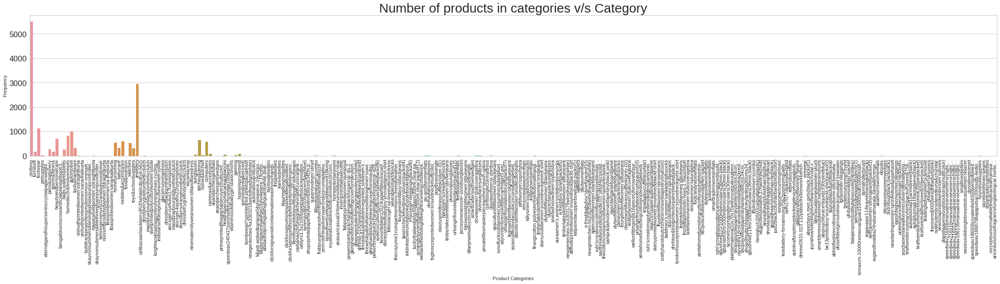

In [156]:
#filtering out some of the categories with count less than 10 
primary_category_count = Counter(primary_category)
print("The length of the unique Product Categories after some filtering is {}".format(len(primary_category_count)))

all_categories_temp=[]
count_temp=[]

for keys,vals in primary_category_count.items():
  all_categories_temp.append(keys)
  count_temp.append(vals)

plt.figure(figsize=(40,6))
plt.title("Number of products in categories v/s Category", fontsize=30)
plt.xlabel("Product Categories")
plt.ylabel("Frequency")
plt.xticks(fontsize=11,rotation=90)
plt.yticks(fontsize=18)
sns.barplot(x=all_categories_temp, y=count_temp)

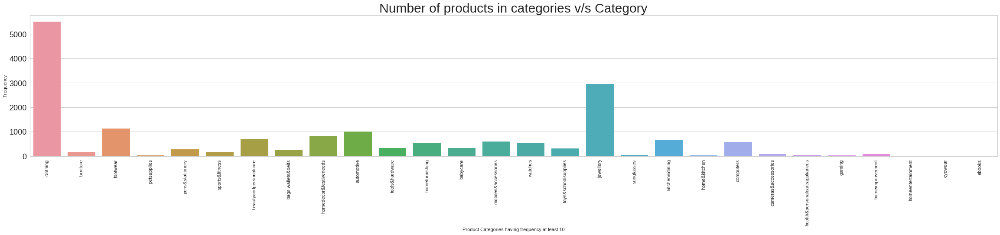

In [157]:
all_categories=[]
count=[]

for keys,vals in primary_category_count.items():
  #choosing only those categories which have at least 10 producrs
  if(vals>=10):
    all_categories.append(keys)
    count.append(vals)

plt.figure(figsize=(40,6))
plt.title("Number of products in categories v/s Category", fontsize=30)
plt.xlabel("Product Categories having frequency at least 10")
plt.ylabel("Frequency")
plt.xticks(fontsize=11,rotation=90)
plt.yticks(fontsize=18)
sns.barplot(x=all_categories, y=count)

In [158]:
#Combining the redundant categories

revised_categories = [None]*len(primary_category)

for i in range(len(primary_category)):
  if primary_category[i]=="homeimprovement" or primary_category[i]=="homedecor&festiveneeds" or primary_category[i]=='home&kitchen' or primary_category[i]=="kitchen&dining" or primary_category[i]=="homefurnishing" or primary_category[i]=="furniture" or primary_category[i]=="homeentertainment":
    revised_categories[i] = 'homefurnishing/kitchen'
  elif primary_category[i]=='pens&stationery':
    revised_categories[i] = 'toys&schoolsupplies'
  elif primary_category[i]=='gaming' or primary_category[i]=='cameras&accessories' or primary_category[i]=='computers' or primary_category[i]=="mobiles&accessories":
    revised_categories[i]='electronics'
  elif primary_category[i]=='health&personal care appliances' or primary_category[i]=='beautyandpersonalcare' or primary_category[i]=='eyewear' or primary_category[i]=='sunglasses' or primary_category[i]=='watches' or primary_category[i]=='bags,wallets&belts' or primary_category[i]=='health&personalcareappliances':
    revised_categories[i]='personalaccessories'
  else:
    revised_categories[i] = primary_category[i]

print("The length of the revised grouped categories are {}".format(len(Counter(revised_categories))))
print(revised_categories)

The length of the revised grouped categories are 250
['clothing', 'homefurnishing/kitchen', 'footwear', 'clothing', 'petsupplies', 'eternalgandhisuperseriescrystalpaperweight...', 'clothing', 'homefurnishing/kitchen', 'footwear', 'clothing', 'footwear', 'clothing', 'petsupplies', 'clothing', 'toys&schoolsupplies', 'clothing', 'homefurnishing/kitchen', 'footwear', 'clothing', 'homefurnishing/kitchen', 'petsupplies', 'clothing', 'clothing', 'footwear', 'petsupplies', 'clothing', 'sports&fitness', 'personalaccessories', 'clothing', 'clothing', 'bengalbloomsroseartificialplantwithpot(3...', 'clothing', 'toys&schoolsupplies', 'toys&schoolsupplies', 'toys&schoolsupplies', 'clothing', 'toys&schoolsupplies', 'clothing', 'personalaccessories', 'clothing', 'footwear', 'homefurnishing/kitchen', 'automotive', 'tools&hardware', "vishudhprintedwomen'sstraightkurta", "vishudhprintedwomen'sstraightkurta", "vishudhprintedwomen'sanarkalikurta", 'buildtrackpirwirelessmotionsensor-oneswit...', 'skayvonsum

In [159]:
#creating a new column in the dataframe which stores these revised grouped categories
product["primary_categories"] = revised_categories
product.head(10)

,Product name in Amazon,product_category_tree,Retail Price in Amazon,Discounted Price in Amazon,description,brand,primary_categories
0,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",982,438,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing
1,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",32143,29121,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,FabHomeDecor,homefurnishing/kitchen
2,AW Bellies,"[""Footwear >> Women's Footwear >> Ballerinas >...",991,551,Key Features of AW Bellies Sandals Wedges Heel...,AW,footwear
3,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",694,325,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing
4,Sicons All Purpose Arnica Dog Shampoo,"[""Pet Supplies >> Grooming >> Skin & Coat Care...",208,258,Specifications of Sicons All Purpose Arnica Do...,Sicons,petsupplies
5,Eternal Gandhi Super Series Crystal Paper Weig...,"[""Eternal Gandhi Super Series Crystal Paper We...",427,473,Key Features of Eternal Gandhi Super Series Cr...,Eternal Gandhi,eternalgandhisuperseriescrystalpaperweight...
6,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",1198,602,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing
7,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",32137,28664,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,FabHomeDecor,homefurnishing/kitchen
8,"dilli bazaaar Bellies, Corporate Casuals, Casuals","[""Footwear >> Women's Footwear >> Ballerinas >...",682,385,"Key Features of dilli bazaaar Bellies, Corpora...",dilli bazaaar,footwear
9,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",1197,542,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing


In [160]:
temp_categories = list(dict.fromkeys(list(products.loc[:,'primary_categories'].values)))

considered_category = []
revised_category_count = {}
noise = {}
all_categories = {}

print("\n")
print("********************* THE FINAL CONSIDERED CATEGORIES AND THEIR COUNTS ARE AS FOLLOWS *************************")
print("\n")

for category in temp_categories:
  count = np.sum(product.loc[:, 'primary_categories'].values == category)
  all_categories[category]=count
    #a category is considered to be a main category only if the frequency of a product in that category is at least 10
  if(count>=10):
    print(category,count)
    revised_category_count[category] = count   
  else:
    noise[category] = count

for i in range(len(revised_categories)):
  if revised_categories[i] in revised_category_count:
    considered_category.append(1)
  else:
    considered_category.append(0)

print("\n")
print("********************* THE NOISE IN THE DATASET IS AS FOLLOWS *************************")
print("\n")
for keys,vals in noise.items():
  print(keys,vals)

print("\n")
print("********************* THE NOISE + PRIMARY CATEGORIES IN THE DATASET ARE AS FOLLOWS *************************")
print("\n")
for keys,vals in all_categories.items():
  print(keys,vals)



********************* THE FINAL CONSIDERED CATEGORIES AND THEIR COUNTS ARE AS FOLLOWS *************************


clothing 5504
homefurnishing/kitchen 2307
footwear 1123
petsupplies 30
toys&schoolsupplies 591
sports&fitness 166
personalaccessories 1578
automotive 1009
tools&hardware 333
babycare 324
electronics 1284
jewellery 2946
ebooks 15


********************* THE NOISE IN THE DATASET IS AS FOLLOWS *************************


noise 0


********************* THE NOISE + PRIMARY CATEGORIES IN THE DATASET ARE AS FOLLOWS *************************


clothing 5504
homefurnishing/kitchen 2307
footwear 1123
petsupplies 30
noise 0
toys&schoolsupplies 591
sports&fitness 166
personalaccessories 1578
automotive 1009
tools&hardware 333
babycare 324
electronics 1284
jewellery 2946
ebooks 15


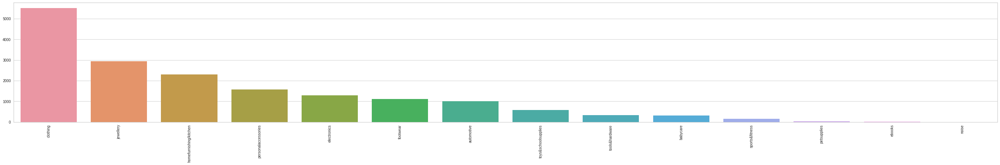

In [161]:
#Visualisation of the Noise + Primary Categories

all_categories = dict(sorted(all_categories.items(), key=lambda item: item[1], reverse=True))

all_categories_keys = list(all_categories.keys())
all_categories_freq = list(all_categories.values())

fig = plt.figure(figsize = (48, 6))
plt.xticks(rotation=90)
sns.barplot(x=all_categories_keys ,y=all_categories_freq)

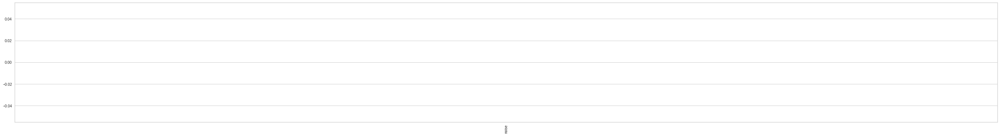

In [162]:
#Visualisation of only Noise in the dataset

noise = dict(sorted(noise.items(), key=lambda item: item[1], reverse=True))

noise_keys = list(noise.keys())
noise_freq = list(noise.values())

fig = plt.figure(figsize = (48, 6))
plt.xticks(rotation=90)
sns.barplot(x=noise_keys ,y=noise_freq)

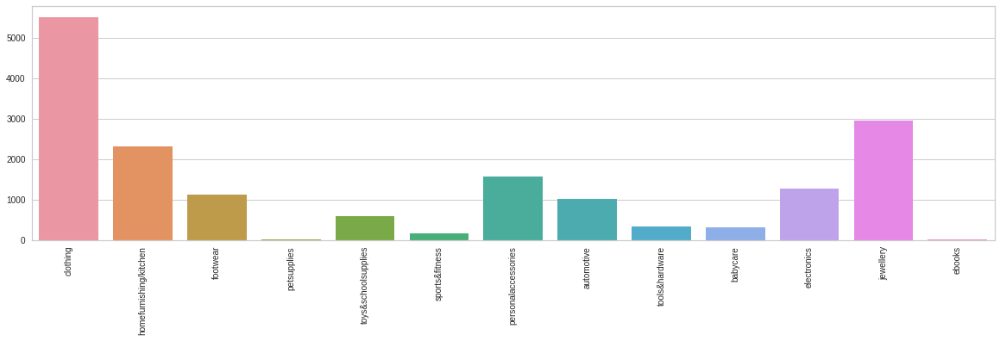

In [163]:
#Frequency Plot of the revised categories

categories = list(revised_category_count.keys())
frequency = list(revised_category_count.values())

fig = plt.figure(figsize = (20, 5))
plt.xticks(rotation=90)
sns.barplot(x=categories,y=frequency)

A main_category column is added to the dataset having binary values. Its value for a particular row is 1 if that product lies in any of the above mentioned 13 classes, otherwise it is 0.

In [164]:
product["main_category"] = considered_category
product.head(10)

,Product name in Amazon,product_category_tree,Retail Price in Amazon,Discounted Price in Amazon,description,brand,primary_categories,main_category
0,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",982,438,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1
1,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",32143,29121,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,FabHomeDecor,homefurnishing/kitchen,1
2,AW Bellies,"[""Footwear >> Women's Footwear >> Ballerinas >...",991,551,Key Features of AW Bellies Sandals Wedges Heel...,AW,footwear,1
3,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",694,325,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1
4,Sicons All Purpose Arnica Dog Shampoo,"[""Pet Supplies >> Grooming >> Skin & Coat Care...",208,258,Specifications of Sicons All Purpose Arnica Do...,Sicons,petsupplies,1
5,Eternal Gandhi Super Series Crystal Paper Weig...,"[""Eternal Gandhi Super Series Crystal Paper We...",427,473,Key Features of Eternal Gandhi Super Series Cr...,Eternal Gandhi,eternalgandhisuperseriescrystalpaperweight...,0
6,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",1198,602,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1
7,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",32137,28664,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,FabHomeDecor,homefurnishing/kitchen,1
8,"dilli bazaaar Bellies, Corporate Casuals, Casuals","[""Footwear >> Women's Footwear >> Ballerinas >...",682,385,"Key Features of dilli bazaaar Bellies, Corpora...",dilli bazaaar,footwear,1
9,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",1197,542,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1


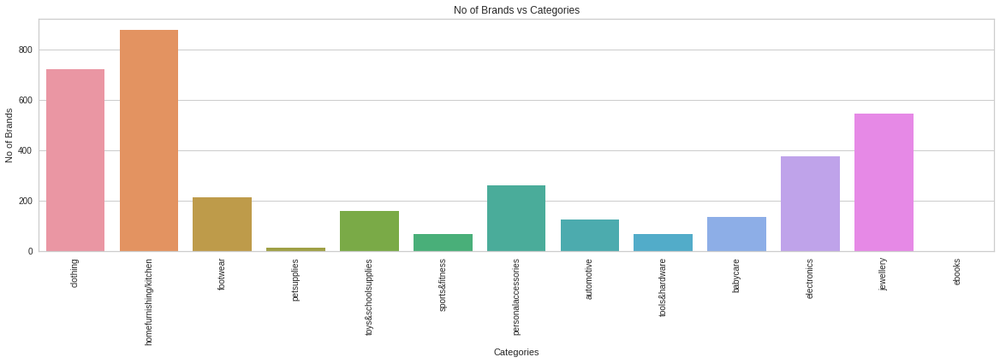

In [165]:
#Plotting the number of Brands per Category

temp_df = product.copy(deep=True)
temp_df = temp_df[temp_df['brand'].notna()]
temp_df = temp_df[temp_df["main_category"]==1]

#list containing the revised categories
category_list = []
#list containing the number of brands corresponding to that category
brand_freq_list = []

for category in categories:
  df = temp_df[temp_df["primary_categories"]==category]
  category_brand_count = list(dict.fromkeys(list(df.loc[:,'brand'].values)))
  category_list.append(category)
  brand_freq_list.append(len(category_brand_count))

#plotting the graph
fig = plt.figure(figsize = (20, 5))
plt.xticks(rotation=90)
plt.xlabel("Categories")
plt.ylabel("No of Brands")
plt.title("No of Brands vs Categories")
sns.barplot(x=category_list,y=brand_freq_list)

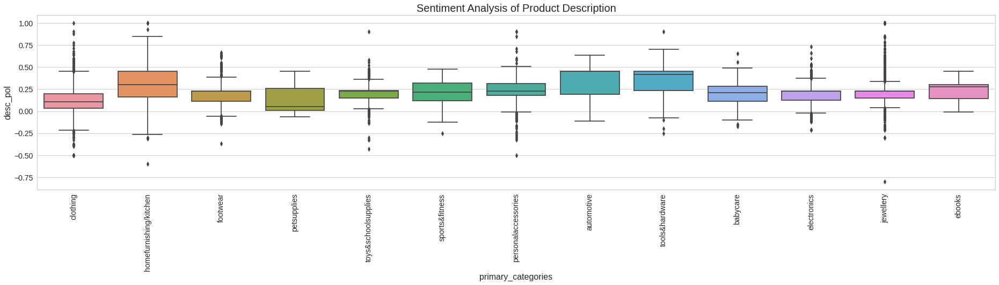

In [166]:
#Sentiment Analysis
#Sentiment analysis of the Product Description corresponding to each category. This is done by measuring the polarity of each product's description.

product['desc_pol']=product['description'].apply(lambda x : TextBlob(x).sentiment.polarity)

plt.figure(figsize=(32,6))
plt.title("Sentiment Analysis of Product Description", fontsize=20)
plt.xlabel("Polarity", fontsize=16)
plt.ylabel("Product Description", fontsize=16)
plt.xticks(fontsize=14,rotation=90)
plt.yticks(fontsize=14)
sns.boxplot(x="primary_categories", y='desc_pol', data=product[product['main_category']==1])

In [167]:
#Text Length Analysis

#finding the length of the description
max_desc_len = -1
desc_len_sum = 0
min_desc_len = maxsize

product_description = product["description"].tolist()

for i in range(len(product_description)):
  try:
    max_desc_len = max(max_desc_len,len(product_description[i]))
    min_desc_len = min(min_desc_len,len(product_description[i]))
    desc_len_sum+=len(product_description[i])
  except:
    pass

print("Max description length is {}.".format(max_desc_len))
print("Min description length is {}.".format(min_desc_len))
print("Average description length is {}.".format(desc_len_sum/len(product_description)))

Max description length is 5309.
Min description length is 74.
Average description length is 439.77183580387685.


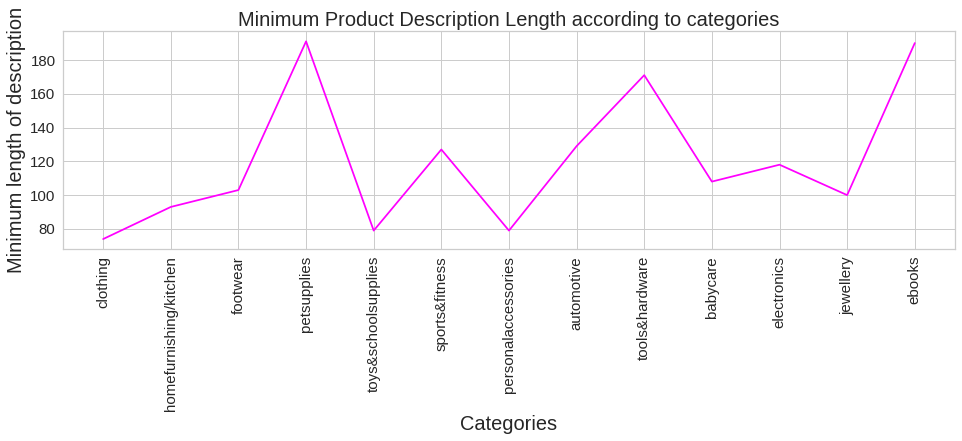

In [168]:
#Visualisation of the Minimum description length across all the categories

min_len = []
x = []

for category in temp_categories:
  temp_df = product[product["primary_categories"]==category]
  temp_df = temp_df[temp_df["main_category"]==1]
  try:
    temp_min_len = min(temp_df["description"].str.len())
    x.append(category)
    min_len.append(temp_min_len)
  except:
    pass
  

plt.figure(figsize=(16,4))
plt.title("Minimum Product Description Length according to categories", fontsize=20)
plt.ylabel("Minimum length of description", fontsize=20)
plt.xlabel("Categories", fontsize=20)
plt.xticks(fontsize=15,rotation=90)
plt.yticks(fontsize=15)
plt.plot(x,min_len, color = "magenta")

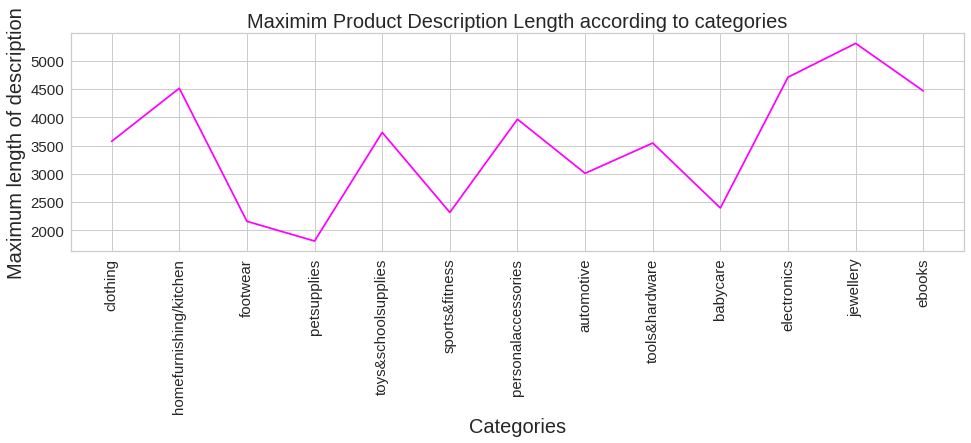

In [169]:
#Visualisation of the Maximum description length across all the categories

max_len = []
x = []

for category in temp_categories:
  temp_df = product[product["primary_categories"]==category]
  temp_df = temp_df[temp_df["main_category"]==1]
  try:
    temp_max_len = max(temp_df["description"].str.len())
    x.append(category)
    max_len.append(temp_max_len)
  except:
    pass
  

plt.figure(figsize=(16,4))
plt.title("Maximim Product Description Length according to categories", fontsize=20)
plt.ylabel("Maximum length of description", fontsize=20)
plt.xlabel("Categories", fontsize=20)
plt.xticks(fontsize=15,rotation=90)
plt.yticks(fontsize=15)
plt.plot(x,max_len, color = "magenta")

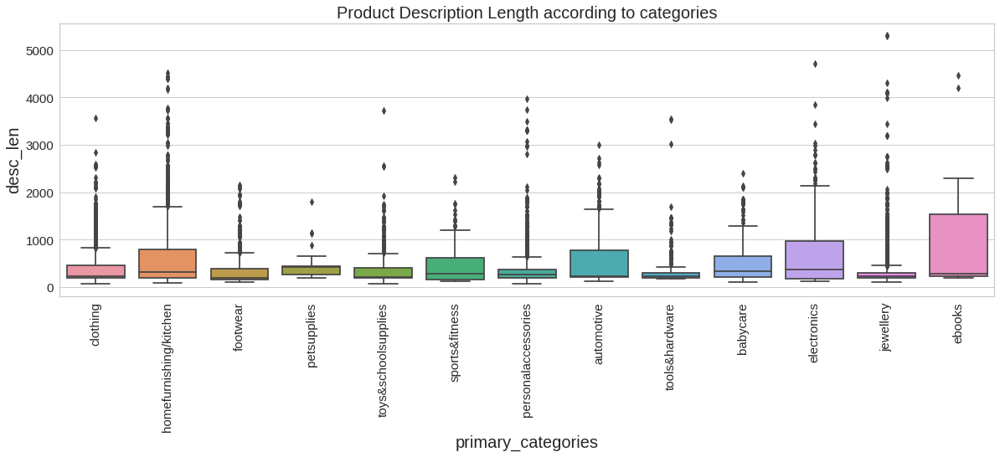

In [170]:
#Boxplot of the Average description length across all the categories

product["desc_len"] = product["description"].str.len()

plt.figure(figsize=(20,6))
plt.title("Product Description Length according to categories", fontsize=20)
plt.ylabel("Average of length of description", fontsize=20)
plt.xlabel("Number of Categories", fontsize=20)
plt.xticks(fontsize=15,rotation=90)
plt.yticks(fontsize=15)
sns.boxplot(x="primary_categories", y='desc_len', data=product[product['main_category']==1])

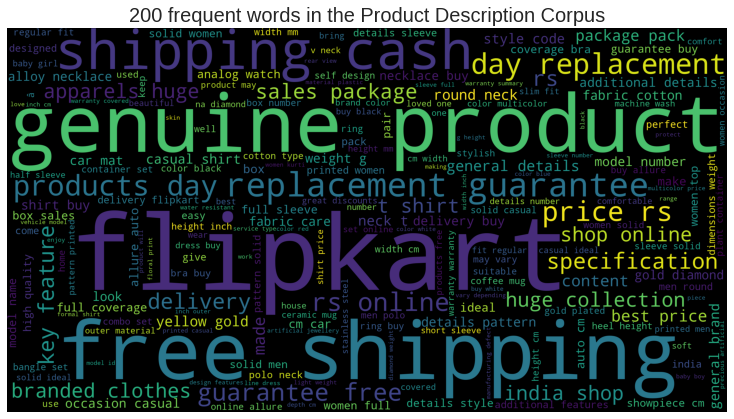

In [171]:
#Word cloud consisting of the most frequent words in the Product Description

product_content = ""

for i in product["description"]: 
    i = str(i) 
    separate = i.split() 
    for j in range(len(separate)): 
        separate[j] = separate[j].lower() 
      
    product_content += " ".join(separate)+" "

stop_words = set(STOPWORDS)
final_wordcloud = WordCloud(width = 3000, height = 1600, 
                            max_words=200,
                            background_color ='black', 
                            stopwords = stop_words, 
                            min_font_size = 10).generate(product_content)

plt.figure(figsize = (10, 10), facecolor = None) 
plt.title("200 frequent words in the Product Description Corpus", fontsize=20)
plt.imshow(final_wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show()

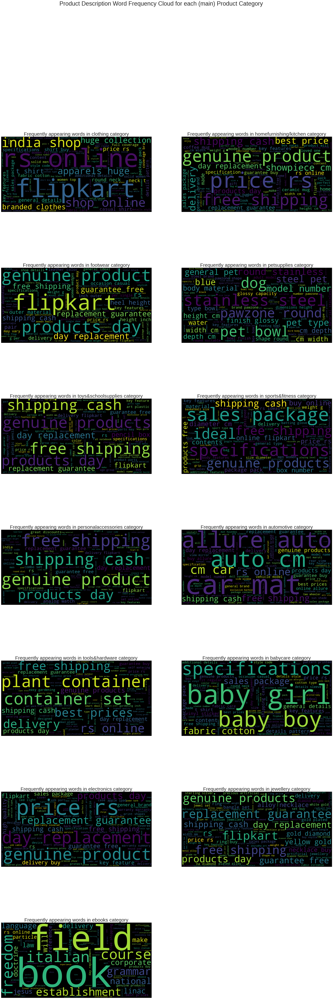

In [172]:
#Word Cloud for each Category in the Corpus

plt.figure(figsize = (36, 100), facecolor = None) 
plt.suptitle("Product Description Word Frequency Cloud for each (main) Product Category",fontsize=36)
j = math.ceil(len(categories)/2)

for i,c in enumerate(categories):
  temp = i+1
  desc = product[product['primary_categories']==c].description.str.lower().values
  plt.subplot(j, 2, temp).set_title("Frequently appearing words in {} category".format(c), fontsize=30)
  word_cloud = WordCloud(background_color="black",max_words=100,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
  word_cloud.generate(" ".join(desc))
  plt.axis("off")
  plt.imshow(word_cloud)
plt.show()

In [173]:
#Character Contraction

#During this analysis of the characters, we can see that there are several emoticons, letters from different languages (Chinese), etc that can be seen. These are then removed from the corpus.

corpus = ' '.join(product['description']).lower()
characters = Counter(corpus)
sorted(characters.items(), key=lambda i: i[1], reverse=True)

total=0
for i in ascii_letters+punctuation+digits:
  total+=characters[i]

print("The % of data consisting of only English Characters is {}.".format(100*total/len(' '.join(product['description']))))
print("\n")
print(characters)

The % of data consisting of only English Characters is 82.498667401703.


Counter({' ': 1303394, 'e': 664583, 'a': 488584, 'o': 454519, 't': 430811, 'i': 425570, 'r': 424941, 'n': 394422, 's': 380971, 'l': 336582, 'c': 259101, 'd': 215457, 'h': 188897, 'p': 184333, 'u': 174906, 'f': 160662, 'm': 156911, 'y': 137707, 'g': 135741, 'b': 110851, '.': 91277, 'w': 84356, 'k': 70260, 'v': 53341, ',': 41373, '0': 32338, '1': 28831, '-': 27391, '\t': 23356, '9': 21751, '3': 19141, '\n': 19097, '2': 18392, ':': 18150, '5': 15294, 'x': 14744, "'": 14489, '4': 12770, 'j': 10025, 'z': 9922, '8': 8396, ')': 7951, '6': 7948, '(': 7682, '7': 6807, 'q': 6747, '!': 6321, '&': 5926, '/': 4141, 'â': 2212, '"': 1486, '€': 1230, '%': 1130, '_': 1005, '\xa0': 757, '*': 725, '\r': 690, '#': 672, '¢': 512, '™': 442, ';': 402, '?': 386, '+': 378, 'ã': 250, '|': 241, '@': 147, '©': 138, '\x9d': 121, '=': 117, 'œ': 99, 'ï': 99, '½': 89, '¿': 89, '“': 74, '®': 42, '¦': 41, 'ƒ': 41, '°': 39, '˜': 25, '‚': 23, ']': 

In [174]:
# getting all the words ending an apostrophe and single letter
contractions = Counter(re.findall("[a-z]+'[a-z]+", corpus))
apostrophe_end = sorted(contractions.items(), key=lambda i: i[1], reverse=True)
print("\n")
print(apostrophe_end)

# getting all the words starting with a single letter and an apostrophe
contractions=Counter(re.findall("[a-z]'[a-z]+", corpus))
apostrophe_start = sorted(contractions.items(), key=lambda i: i[1], reverse=True)
print("\n")
print(apostrophe_start)

#getting all the URLS
urls = re.findall('\(*http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+#]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))*', corpus)
print("\n")
print(urls)



[("women's", 7336), ("men's", 3191), ("girl's", 1062), ("boy's", 790), ("don't", 159), ("you're", 125), ("product's", 96), ("it's", 95), ("doesn't", 52), ("nod'r", 33), ("customer's", 32), ("bra's", 31), ("ruhi's", 30), ("won't", 29), ("you'll", 29), ("d'clair", 26), ("manufacturer's", 25), ("they're", 25), ("adapter's", 24), ("laptop's", 24), ("can't", 22), ("layer'r", 22), ("l'appel", 22), ("monitor's", 19), ("india's", 19), ("today's", 18), ("woman's", 17), ("bras's", 16), ("car's", 15), ("phone's", 14), ("dede's", 13), ("kid's", 12), ("baby's", 12), ("you'd", 11), ("jerry's", 11), ("world's", 10), ("company's", 10), ("model's", 9), ("scheffer's", 9), ("combo's", 9), ("what's", 8), ("wellworth's", 8), ("one's", 8), ("child's", 8), ("l'elegantae", 8), ("lord's", 8), ("computer's", 8), ("vehicle's", 7), ("finger's", 7), ("seema's", 7), ("viewer's", 7), ("there's", 7), ("buyer's", 7), ("man's", 6), ("shirt's", 6), ("i'm", 6), ("chef'n", 6), ("kb's", 6), ("wearer's", 6), ("anand's", 6

In [175]:
custom_contracts = {
    "women's" : "women",
    "men's" : "men",
    "girl's" : "girl",
    "boy's" : "boy",
    "don't" : "do not",
    "product's" : "product",
    "it's" : "its",
    "bra's" : "bras",
    "won't": "will not",
    "doesn't" : "does not",
    "l's" : " ",
    "n's" : " ",
    "y's" : " ",
    "n't" : "not",
    "r's" : "rs",
    "u're" : "your",
    "a's" : " ",
    "e's": " "
}

custom_stopwords = [w for w in set(stopwords.words("english"))]
custom_stopwords += list(punctuation)
stopwords_dataset = ["replacement","shipping","delivery","cash", "rs", "amazon", "genuine", "details", "guarantee","free", "genuine", "amazon.com"]
custom_stopwords.extend(stopwords_dataset)
wordnet_lemmatizer = WordNetLemmatizer()

In [176]:
def clean(text):

  for i in range(len(text)):
    text[i] = text[i].lower()
    text[i] = text[i].replace("\n"," ")
    for keys,values in custom_contracts.items():
      text[i] = text[i].replace(keys,values)
    text[i] = re.sub("[a-z]'[a-z]+", " ", text[i])
    #removing the extra whitespaces
    text[i] = re.sub(' +', ' ', text[i])
    #keeping only the ascii characters -> handles emoticons, letters from other languages, etc
    text[i] = re.sub(r'[^\x00-\x7F]+',' ', text[i])
    #removing the urls
    text[i] = re.sub('[(]?http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+#]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F])/)*', ' ', text[i])
    text[i] = ''.join([j for j in text[i] if not j.isdigit()])
    text[i] = text[i].split()
    text[i] = ' '.join([word for word in text[i] if word not in custom_stopwords])
    #removing the punctuations
    text[i] = re.sub(r'[^\w\s]', '', text[i])
    #lemmatization
    text[i] = [wordnet_lemmatizer.lemmatize(w) for w in word_tokenize(text[i])]
    #removing the words which have a length less than 3
    text[i] = [word for word in text[i] if len(word)>=3]
  
  return text

raw_description = product["description"].tolist()
cleaned_description = clean(raw_description)
print(cleaned_description[:5])

[['key', 'feature', 'alisha', 'solid', 'woman', 'cycling', 'short', 'cotton', 'lycra', 'navy', 'red', 'navyspecifications', 'alisha', 'solid', 'woman', 'cycling', 'short', 'short', 'number', 'content', 'sale', 'package', 'pack', 'fabric', 'cotton', 'lycra', 'type', 'cycling', 'short', 'general', 'pattern', 'solid', 'ideal', 'woman', 'fabric', 'care', 'gentle', 'machine', 'wash', 'lukewarm', 'water', 'bleach', 'additional', 'style', 'code', 'altht_p_', 'box', 'short'], ['fabhomedecor', 'fabric', 'double', 'sofa', 'bed', 'finish', 'color', 'leatherette', 'black', 'mechanism', 'type', 'pull', 'out', 'price', 'fine', 'deep', 'seating', 'experience', 'save', 'space', 'new', 'click', 'clack', 'sofa', 'bed', 'easy', 'fold', 'vice', 'versa', 'simple', 'click', 'clack', 'mechanism', 'chrome', 'leg', 'mango', 'wood', 'frame', 'long', 'term', 'durability', 'double', 'cushioned', 'sofa', 'bed', 'provide', 'extra', 'softness', 'make', 'fine', 'seating', 'experience', 'double', 'bed', 'easily', 'sle

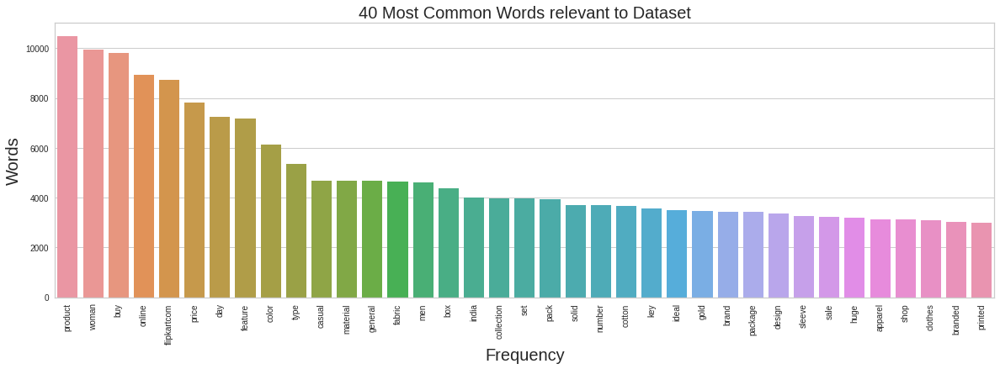

In [177]:
#Visualisation of the most common words

corpus = []
for text in cleaned_description:
  for word in text:
    corpus.append(word)

counter = Counter(corpus)
most=counter.most_common()
x, y = [], []
for word,count in most[:40]:
  if (word not in custom_stopwords):
    x.append(word)
    y.append(count)

plt.figure(figsize=(20,6))
plt.title("40 Most Common Words relevant to Dataset", fontsize=20)
plt.ylabel("Words", fontsize=20)
plt.xlabel("Frequency", fontsize=20)
plt.xticks(rotation=90)            
sns.barplot(x=x,y=y)

In [178]:
temp_cleaned_description = [" ".join(sentence) for sentence in cleaned_description]
product["cleaned_desc"] = temp_cleaned_description
product.head(10)

,Product name in Amazon,product_category_tree,Retail Price in Amazon,Discounted Price in Amazon,description,brand,primary_categories,main_category,desc_pol,desc_len,cleaned_desc
0,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",982,438,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1,0.143750,410,key feature alisha solid woman cycling short c...
1,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",32143,29121,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,FabHomeDecor,homefurnishing/kitchen,1,0.113814,4445,fabhomedecor fabric double sofa bed finish col...
2,AW Bellies,"[""Footwear >> Women's Footwear >> Ballerinas >...",991,551,Key Features of AW Bellies Sandals Wedges Heel...,AW,footwear,1,0.027778,650,key feature belly sandal wedge heel casualsaw ...
3,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",694,325,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1,0.122917,403,key feature alisha solid woman cycling short c...
4,Sicons All Purpose Arnica Dog Shampoo,"[""Pet Supplies >> Grooming >> Skin & Coat Care...",208,258,Specifications of Sicons All Purpose Arnica Do...,Sicons,petsupplies,1,0.050000,248,specification sicons purpose arnica dog shampo...
5,Eternal Gandhi Super Series Crystal Paper Weig...,"[""Eternal Gandhi Super Series Crystal Paper We...",427,473,Key Features of Eternal Gandhi Super Series Cr...,Eternal Gandhi,eternalgandhisuperseriescrystalpaperweight...,0,0.322727,882,key feature eternal gandhi super series crysta...
6,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",1198,602,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1,0.127778,416,key feature alisha solid woman cycling short c...
7,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",32137,28664,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,FabHomeDecor,homefurnishing/kitchen,1,0.135063,4397,fabhomedecor fabric double sofa bed finish col...
8,"dilli bazaaar Bellies, Corporate Casuals, Casuals","[""Footwear >> Women's Footwear >> Ballerinas >...",682,385,"Key Features of dilli bazaaar Bellies, Corpora...",dilli bazaaar,footwear,1,-0.032143,428,key feature dilli bazaaar belly corporate casu...
9,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",1197,542,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1,0.098333,419,key feature alisha solid woman cycling short c...


In [179]:
#Converting the Primary Category of all Noise datapoints into Noise label

product.loc[product['main_category'] == 0, 'primary_categories'] = "noise"
product.sample(10)

,Product name in Amazon,product_category_tree,Retail Price in Amazon,Discounted Price in Amazon,description,brand,primary_categories,main_category,desc_pol,desc_len,cleaned_desc
7430,The Yellow Door Planters with Tray/ Tea Light ...,"[""Tools & Hardware >> Tools >> Gardening Tools...",1498,778,Buy The Yellow Door Planters with Tray/ Tea Li...,The Yellow Door,tools&hardware,1,0.220000,293,buy yellow door planter tray tea light holder ...
15526,ANTSHRIKE MEN'S PYJAMA,"[""Clothing >> Men's Clothing >> Inner Wear & S...",2279,1856,Key Features of Antshrike Men's Pyjama Multico...,Antshrike,clothing,1,0.192857,589,key feature antshrike men pyjama multicolor co...
15439,"LOLASKI SLEEVELESS SELF DESIGN GIRL'S, WOMEN'S...","[""Clothing >> Kids' Clothing >> Girls Wear >> ...",3990,2532,Specifications of Lolaski Sleeveless Self Desi...,Lolaski,clothing,1,0.475000,265,specification lolaski sleeveless self design g...
8992,Clovia Women's Plunge Bra,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",335,193,Clovia Women's Plunge Bra - Buy Pink Clovia Wo...,Pink,clothing,1,0.075000,178,clovia woman plunge bra buy pink clovia woman ...
5570,Eshoppee Jesus Christ Gold Finish Alloy Necklace,"[""Jewellery >> Necklaces & Chains >> Necklaces""]",479,286,Eshoppee Jesus Christ Gold Finish Alloy Neckla...,Eshoppee,jewellery,1,0.225000,225,eshoppee jesus christ gold finish alloy neckla...
313,Taj Pearl Alloy Cuff,"[""Jewellery >> Bangles, Bracelets & Armlets >>...",648,504,Key Features of Taj Pearl Alloy Cuff Ideal For...,Taj Pearl,jewellery,1,0.268519,783,key feature taj pearl alloy cuff ideal for wom...
9766,Fab Palace Party Sleeveless Embroidered Women'...,"[""Clothing >> Women's Clothing >> Fusion Wear ...",1551,546,Key Features of Fab Palace Party Sleeveless Em...,Fab Palace,clothing,1,0.271795,542,key feature fab palace party sleeveless embroi...
2634,Dressberry Casual Sleeveless Solid Women's Top,"[""Clothing >> Women's Clothing >> Western Wear...",892,447,Dressberry Casual Sleeveless Solid Women's Top...,NaN,clothing,1,0.044444,221,dressberry casual sleeveless solid woman top b...
14993,RUCHIWORLD COTTON BATH TOWEL,"[""Home Furnishing >> Bath Linen >> Towels""]",797,478,"Ruchiworld Cotton Bath Towel (1, Pink, Purple)...",Ruchiworld,homefurnishing/kitchen,1,0.389683,1044,ruchiworld cotton bath towel pink purple price...
11978,"Rakam Gold Ruby, Diamond Yellow Gold 18 K Ring","[""Jewellery >> Rings""]",39863,37933,"Rakam Gold Ruby, Diamond Yellow Gold 18 K Ring...",Rakam,jewellery,1,0.150000,223,rakam gold ruby diamond yellow gold ring buy r...


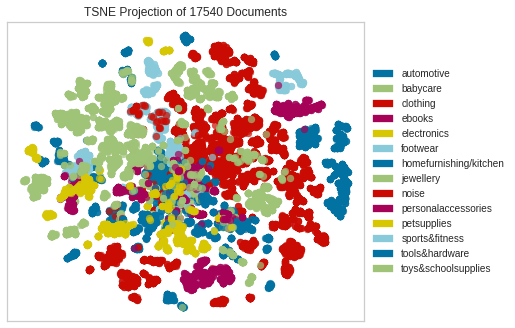

In [180]:
#Visualization of the Overlapping of classes using TSNE Plots

from yellowbrick.text import TSNEVisualizer

# creating the document vectors
tfidf = TfidfVectorizer()

description = tfidf.fit_transform(product["cleaned_desc"])
categories_ = product["primary_categories"]

# creating the visualizer
tsne = TSNEVisualizer()
tsne.fit_transform(description, categories_)
tsne.poof()
plt.show()

In [181]:
#Dataframe consisting of categories and their counts

temp_categories = {
    'primary_category':categories,
    'count':frequency
}


temp_categories['primary_category'].append('noise')
temp_categories['count'].append(len(noise))
category_df = pd.DataFrame(temp_categories)
category_df = category_df.sort_values(by = 'count', ascending=False)
category_df = category_df.reset_index(drop=True)
category_df

,primary_category,count
0,clothing,5504
1,jewellery,2946
2,homefurnishing/kitchen,2307
3,personalaccessories,1578
4,electronics,1284
5,footwear,1123
6,automotive,1009
7,toys&schoolsupplies,591
8,tools&hardware,333
9,babycare,324


In [182]:
#saving the unbalanced dataframe into drive

with open('/content/drive/MyDrive/Amazon_unbalanced_products.csv', 'w') as f:
  product.to_csv(f)

In [183]:
# Oversampling
#Random oversampling of the minority classes (i.e. classes apart from clothing and jewellary) is implemented below.

# a copy of the unbalanced dataset is made on which further work is done
balanced_df = product.copy(deep=True)
balanced2_df = product.copy(deep=True)
balanced_df

,Product name in Amazon,product_category_tree,Retail Price in Amazon,Discounted Price in Amazon,description,brand,primary_categories,main_category,desc_pol,desc_len,cleaned_desc
0,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",982,438,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1,0.143750,410,key feature alisha solid woman cycling short c...
1,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",32143,29121,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,FabHomeDecor,homefurnishing/kitchen,1,0.113814,4445,fabhomedecor fabric double sofa bed finish col...
2,AW Bellies,"[""Footwear >> Women's Footwear >> Ballerinas >...",991,551,Key Features of AW Bellies Sandals Wedges Heel...,AW,footwear,1,0.027778,650,key feature belly sandal wedge heel casualsaw ...
3,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",694,325,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1,0.122917,403,key feature alisha solid woman cycling short c...
4,Sicons All Purpose Arnica Dog Shampoo,"[""Pet Supplies >> Grooming >> Skin & Coat Care...",208,258,Specifications of Sicons All Purpose Arnica Do...,Sicons,petsupplies,1,0.050000,248,specification sicons purpose arnica dog shampo...
...,...,...,...,...,...,...,...,...,...,...,...
17535,WALLMANTRA LARGE VINYL STICKERS STICKER,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",3551,1547,Buy Wallmantra Large Vinyl Stickers Sticker fo...,Wallmantra,babycare,1,0.371429,210,buy wallmantra large vinyl sticker sticker onl...
17536,WALLMANTRA EXTRA LARGE VINYL STICKERS STICKER,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",3014,2469,Buy Wallmantra Extra Large Vinyl Stickers Stic...,Wallmantra,babycare,1,0.278571,222,buy wallmantra extra large vinyl sticker stick...
17537,WALLMANTRA EXTRA LARGE VINYL STICKERS STICKER,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",7059,3525,Buy Wallmantra Extra Large Vinyl Stickers Stic...,Wallmantra,babycare,1,0.278571,222,buy wallmantra extra large vinyl sticker stick...
17538,WALLMANTRA EXTRA LARGE VINYL STICKERS STICKER,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",5794,2583,Buy Wallmantra Extra Large Vinyl Stickers Stic...,Wallmantra,babycare,1,0.278571,222,buy wallmantra extra large vinyl sticker stick...


In [184]:
from sklearn.utils import resample

balanced_df = balanced_df.loc[balanced_df['main_category'] == 1]

final_balanced_df = {category: balanced_df[balanced_df['primary_categories']==category] for category in set(balanced_df['primary_categories'])}

train_df_1 = pd.concat([resample(data, n_samples=3000, replace=True, random_state=42) for data in final_balanced_df.values()])
train_df_1

,Product name in Amazon,product_category_tree,Retail Price in Amazon,Discounted Price in Amazon,description,brand,primary_categories,main_category,desc_pol,desc_len,cleaned_desc
5418,Alex's Barbie Series Barbie Doll Art Plastic P...,"[""Toys & School Supplies >> School Supplies >>...",792,385,Flipkart.com: Buy Alex's Barbie Series Barbie ...,NaN,toys&schoolsupplies,1,0.225000,195,flipkartcom buy ale barbie series barbie doll ...
13644,Platignum Carnaby Street Ball Pen,"[""Pens & Stationery >> Pens >> Ball Pens >> Pl...",690,795,Platignum Carnaby Street Ball Pen (Blue)\n ...,Platignum,toys&schoolsupplies,1,0.362835,1420,platignum carnaby street ball pen blue price c...
6317,Aardee Varsity Design Art Thick fabric Pencil Box,"[""Toys & School Supplies >> School Supplies >>...",343,349,Aardee Varsity Design Art Thick fabric Pencil ...,NaN,toys&schoolsupplies,1,0.016667,207,aardee varsity design art thick fabric pencil ...
5430,Outshiny Eagle Printed Art Polyester Pencil Box,"[""Toys & School Supplies >> School Supplies >>...",187,169,Outshiny Eagle Printed Art Polyester Pencil Bo...,NaN,toys&schoolsupplies,1,0.330000,786,outshiny eagle printed art polyester pencil bo...
5207,Starmark BTS Flowers Art Polyester Pencil Box,"[""Toys & School Supplies >> School Supplies >>...",178,116,Flipkart.com: Buy Starmark BTS Flowers Art Pol...,NaN,toys&schoolsupplies,1,0.225000,184,flipkartcom buy starmark bts flower art polyes...
...,...,...,...,...,...,...,...,...,...,...,...
2821,Feminine Casual Sleeveless Printed Women's Mul...,"[""Clothing >> Women's Clothing >> Western Wear...",497,365,Key Features of Feminine Casual Sleeveless Pri...,Feminine,clothing,1,0.113636,341,key feature feminine casual sleeveless printed...
10578,Bombay High Women's Solid Formal Shirt,"[""Clothing >> Women's Clothing >> Western Wear...",780,499,Bombay High Women's Solid Formal Shirt - Buy B...,Slim,clothing,1,0.090000,204,bombay high woman solid formal shirt buy blue ...
9875,Hello Dolly Women's Leggings,"[""Clothing >> Women's Clothing >> Western Wear...",1193,439,Hello Dolly Women's Leggings (Pack of 2)\n ...,NaN,clothing,1,0.158333,682,hello dolly woman legging pack price hello dol...
725,For Kids Girl's A-line Dress,"[""Clothing >> Kids' Clothing >> Girls Wear >> ...",5979,3506,For Kids Girl's A-line Dress\n ...,NaN,clothing,1,0.132955,1000,kid girl aline dress price let little princess...


In [185]:
#Dataframe showing the count of the new oversampled datapoints

temp_balanced_categories = {
    'primary_category':[],
    'count':[]
}

for category in categories:
  count = np.sum(train_df.loc[:, 'primary_categories'].values == category)
  temp_balanced_categories['primary_category'].append(category)
  temp_balanced_categories['count'].append(count)

category_balanced_df = pd.DataFrame(temp_balanced_categories)
category_balanced_df = category_balanced_df.sort_values(by = 'count', ascending=False)
category_balanced_df = category_balanced_df.reset_index(drop=True)
category_balanced_df

,primary_category,count
0,clothing,3000
1,homefurnishing/kitchen,3000
2,footwear,3000
3,petsupplies,3000
4,toys&schoolsupplies,3000
5,sports&fitness,3000
6,personalaccessories,3000
7,automotive,3000
8,tools&hardware,3000
9,babycare,3000


In [186]:
#saving the oversampling balanced dataframe into drive

with open('/content/drive/MyDrive/Amazon_oversampling_balanced_products.csv', 'w') as f:
  train_df_1.to_csv(f)

In [187]:
# Undersampling
#Random undersampling of the majority classes (i.e. clothing and jewellary) is implemented below.

balanced2_df

,Product name in Amazon,product_category_tree,Retail Price in Amazon,Discounted Price in Amazon,description,brand,primary_categories,main_category,desc_pol,desc_len,cleaned_desc
0,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",982,438,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1,0.143750,410,key feature alisha solid woman cycling short c...
1,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",32143,29121,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,FabHomeDecor,homefurnishing/kitchen,1,0.113814,4445,fabhomedecor fabric double sofa bed finish col...
2,AW Bellies,"[""Footwear >> Women's Footwear >> Ballerinas >...",991,551,Key Features of AW Bellies Sandals Wedges Heel...,AW,footwear,1,0.027778,650,key feature belly sandal wedge heel casualsaw ...
3,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",694,325,Key Features of Alisha Solid Women's Cycling S...,Alisha,clothing,1,0.122917,403,key feature alisha solid woman cycling short c...
4,Sicons All Purpose Arnica Dog Shampoo,"[""Pet Supplies >> Grooming >> Skin & Coat Care...",208,258,Specifications of Sicons All Purpose Arnica Do...,Sicons,petsupplies,1,0.050000,248,specification sicons purpose arnica dog shampo...
...,...,...,...,...,...,...,...,...,...,...,...
17535,WALLMANTRA LARGE VINYL STICKERS STICKER,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",3551,1547,Buy Wallmantra Large Vinyl Stickers Sticker fo...,Wallmantra,babycare,1,0.371429,210,buy wallmantra large vinyl sticker sticker onl...
17536,WALLMANTRA EXTRA LARGE VINYL STICKERS STICKER,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",3014,2469,Buy Wallmantra Extra Large Vinyl Stickers Stic...,Wallmantra,babycare,1,0.278571,222,buy wallmantra extra large vinyl sticker stick...
17537,WALLMANTRA EXTRA LARGE VINYL STICKERS STICKER,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",7059,3525,Buy Wallmantra Extra Large Vinyl Stickers Stic...,Wallmantra,babycare,1,0.278571,222,buy wallmantra extra large vinyl sticker stick...
17538,WALLMANTRA EXTRA LARGE VINYL STICKERS STICKER,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",5794,2583,Buy Wallmantra Extra Large Vinyl Stickers Stic...,Wallmantra,babycare,1,0.278571,222,buy wallmantra extra large vinyl sticker stick...


In [188]:
# the datapoints are separated out into jewellary, clothing and non jewellary and clothing entries

jewellary_df = balanced2_df.loc[balanced2_df['primary_categories'] == 'jewellery']
clothing_df = balanced2_df.loc[balanced2_df['primary_categories'] == 'clothing']
not_jewellary_clothing = balanced2_df.loc[balanced2_df['primary_categories'] != 'clothing']
not_jewellary_clothing = not_jewellary_clothing.loc[not_jewellary_clothing['primary_categories'] != 'jewellery']
not_jewellary_clothing = not_jewellary_clothing.loc[not_jewellary_clothing['main_category'] == 1]

print(jewellary_df.shape, clothing_df.shape, not_jewellary_clothing.shape)

(2946, 11) (5504, 11) (8760, 11)


In [189]:
clothing_down = resample(clothing_df, replace = False, n_samples = 1700, random_state = 42)
jewellary_down = resample(jewellary_df, replace = False, n_samples = 1700, random_state = 42)

print(clothing_down.shape, jewellary_down.shape)

(1700, 11) (1700, 11)


In [190]:
undersampled_bal = pd.concat([clothing_down, jewellary_down, not_jewellary_clothing])
undersampled_bal_1 = undersampled_bal.reset_index(drop=True)
undersampled_bal_1

,Product name in Amazon,product_category_tree,Retail Price in Amazon,Discounted Price in Amazon,description,brand,primary_categories,main_category,desc_pol,desc_len,cleaned_desc
0,Silk Dori Casual Printed Women's Kurti,"[""Clothing >> Women's Clothing >> Fusion Wear ...",1291,880,Silk Dori Casual Printed Women's Kurti - Buy B...,NaN,clothing,1,-0.100000,211,silk dori casual printed woman kurti buy blue ...
1,Status Mansi Cream Black Women's Push-up Bra,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",685,381,Status Mansi Cream Black Women's Push-up Bra -...,Black,clothing,1,-0.014286,224,status mansi cream black woman pushup bra buy ...
2,KAXIAA WOMEN'S SHEATH DRESS,"[""Clothing >> Women's Clothing >> Western Wear...",1492,860,Kaxiaa Women's Sheath Dress - Buy Black Kaxiaa...,NaN,clothing,1,0.058333,184,kaxiaa woman sheath dress buy black kaxiaa wom...
3,INMARK MEN'S CHECKERED FORMAL SHIRT,"[""Clothing >> Men's Clothing >> Shirts >> Form...",1093,844,Inmark Men's Checkered Formal Shirt\n ...,Regular,clothing,1,0.167262,861,inmark men checkered formal shirt price put co...
4,INMARK WOMEN'S SHIFT DRESS,"[""Clothing >> Women's Clothing >> Western Wear...",1395,939,Inmark Women's Shift Dress - Buy Black Inmark ...,NaN,clothing,1,0.058333,182,inmark woman shift dress buy black inmark woma...
...,...,...,...,...,...,...,...,...,...,...,...
12155,WALLMANTRA LARGE VINYL STICKERS STICKER,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",3551,1547,Buy Wallmantra Large Vinyl Stickers Sticker fo...,Wallmantra,babycare,1,0.371429,210,buy wallmantra large vinyl sticker sticker onl...
12156,WALLMANTRA EXTRA LARGE VINYL STICKERS STICKER,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",3014,2469,Buy Wallmantra Extra Large Vinyl Stickers Stic...,Wallmantra,babycare,1,0.278571,222,buy wallmantra extra large vinyl sticker stick...
12157,WALLMANTRA EXTRA LARGE VINYL STICKERS STICKER,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",7059,3525,Buy Wallmantra Extra Large Vinyl Stickers Stic...,Wallmantra,babycare,1,0.278571,222,buy wallmantra extra large vinyl sticker stick...
12158,WALLMANTRA EXTRA LARGE VINYL STICKERS STICKER,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",5794,2583,Buy Wallmantra Extra Large Vinyl Stickers Stic...,Wallmantra,babycare,1,0.278571,222,buy wallmantra extra large vinyl sticker stick...


In [191]:
#Dataframe showing the count of the new undersampled datapoints

temp_undersampled = {
    'primary_category':[],
    'count':[]
}

for category in categories:
  count = np.sum(undersampled_bal.loc[:, 'primary_categories'].values == category)
  temp_undersampled['primary_category'].append(category)
  temp_undersampled['count'].append(count)

underbalanced_count = pd.DataFrame(temp_undersampled)
underbalanced_count = underbalanced_count.sort_values(by = 'count', ascending=False)
underbalanced_count = underbalanced_count.reset_index(drop=True)
underbalanced_count

,primary_category,count
0,homefurnishing/kitchen,2307
1,clothing,1700
2,jewellery,1700
3,personalaccessories,1578
4,electronics,1284
5,footwear,1123
6,automotive,1009
7,toys&schoolsupplies,591
8,tools&hardware,333
9,babycare,324


In [192]:
#saving the undersampling balanced dataframe into drive

with open('/content/drive/MyDrive/Amazon_undersampling_balanced_products.csv', 'w') as f:
  undersampled_bal_1.to_csv(f)